<h1 align="center"><b>STATISTICAL ANALYSIS OF IPL AUCTION</b></h1>



<h3 align="center">Team Members</h3>

<h4 align="center"><b>Madhumitha Somasundaram</b></h4>
<h4 align="center"><b>Meghna Nag</b></h4>

<br>

<h4 align="center">University of Colorado Boulder</h4>
<h4 align="center">Spring 2025</h4>

<br>
<br>


## **1. INTRODUCTION**

### OBJECTIVE

The objective of this study is to evaluate the statistical determinants of IPL auction prices and assess how auction price and player attributes influence actual match participation. The analytical approach incorporates hypothesis testing, resampling methods, regression modeling, diagnostics, model selection, and causal inference techniques.


## DATASET DESCRIPTION AND DATASET SOURCE

The IPL auction dataset used in this analysis was compiled from ESPNcricinfo and includes player-level information across the 2020 to 2024 IPL seasons. It contains columns such as Season, Player Name, Player Type (e.g., BAT, BOW, AR, BAT/WK), Sold Price (in crores), Team, Overseas Status, and key performance statistics like Matches (Mat), Innings (Inns), Not Outs (No), Runs, Batting Average (Ave), Balls Faced (BF), Strike Rate (SR), and Wickets. The dataset enables insights into the relationship between auction spending and player performance, team strategies, and auction trends over time.

### **Data Import** 

In [1]:
library(httr)

url <- "https://drive.google.com/uc?export=download&id=1L599pWlxcf9wIcUm69D5DROmCVI7Q_xw"  # Replace with the download link
destfile <- "IPL_2020_2024.csv"  # Destination file name

# Download the file
GET(url, write_disk(destfile, overwrite = TRUE))


Response [https://drive.usercontent.google.com/download?id=1L599pWlxcf9wIcUm69D5DROmCVI7Q_xw&export=download]
  Date: 2025-05-01 21:17
  Status: 200
  Content-Type: application/octet-stream
  Size: 80.8 kB
<ON DISK>  IPL_2020_2024.csvNULL

In [2]:
install.packages("stringr")
library(stringr)
library(dplyr)

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




## **2. DATA PREPROCESSING** 

Data preprocessing for the IPL 2020-2024 dataset involves several important steps to clean and prepare the data for analysis:

- Handling Missing and Invalid Data: Empty strings, hyphens, and missing values (NA) are replaced with zeros across all columns to ensure no invalid or missing data remains in the dataset.
    
- Excluding Non-Numeric Columns: Columns such as "Season", "Players", "Type", and "Team", which contain non-numeric data, are excluded from the conversion to numeric values, preserving the integrity of categorical information.

- Converting Data to Numeric Format: All remaining columns are transformed into numeric values, ensuring that the dataset is ready for quantitative analysis or modeling.

- Cleaning Text Data: Any leading or trailing spaces in the "Team" column are removed using string trimming functions to ensure consistency and avoid errors in subsequent analysis.

- Missing Values Check: A check is performed to ensure there are no remaining missing values in the dataset, confirming that the data is complete.

- Data Summary and Structure Review: The summary() and str() functions are used to generate a summary and structure of the dataset, providing an overview of the data’s statistical properties and the types of each variable, ensuring that the dataset is appropriately formatted for analysis.

In [3]:
ipl_data <- read.csv("IPL_2020_2024.csv", stringsAsFactors = FALSE)
ipl_data[] <- lapply(ipl_data, function(col) {
  col[col == "" | col == "-" | is.na(col)] <- 0
  col
})

sapply(ipl_data, function(x) sum(is.na(x)))

Season    Players       Type Sold.Price       Team   Overseas        Mat 
         0          0          0          0          0          0          0 
      Inns         No       Runs        Ave         BF         SR    Wickets 
         0          0          0          0          0          0          0

In [4]:
exclude_cols <- c("Season", "Players", "Type","Team")

# Convert all other columns to numeric
ipl_data[!(names(ipl_data) %in% exclude_cols)] <- lapply(
  ipl_data[!(names(ipl_data) %in% exclude_cols)],
  function(col) as.numeric(col)
)

In [5]:
# Remove leading and trailing spaces in the 'Team' column
ipl_data <- ipl_data %>%
  mutate(Team = str_trim(Team))
summary(ipl_data)
str(ipl_data)


     Season       Players              Type             Sold.Price    
 Min.   :2020   Length:1146        Length:1146        Min.   : 0.200  
 1st Qu.:2021   Class :character   Class :character   1st Qu.: 0.300  
 Median :2022   Mode  :character   Mode  :character   Median : 1.600  
 Mean   :2022                                         Mean   : 3.535  
 3rd Qu.:2023                                         3rd Qu.: 5.500  
 Max.   :2024                                         Max.   :24.750  
     Team              Overseas           Mat              Inns       
 Length:1146        Min.   :0.0000   Min.   : 0.000   Min.   : 0.000  
 Class :character   1st Qu.:0.0000   1st Qu.: 1.000   1st Qu.: 0.000  
 Mode  :character   Median :0.0000   Median : 6.000   Median : 2.000  
                    Mean   :0.3333   Mean   : 6.754   Mean   : 4.653  
                    3rd Qu.:1.0000   3rd Qu.:12.000   3rd Qu.: 8.750  
                    Max.   :1.0000   Max.   :17.000   Max.   :17.000  
      

'data.frame':	1146 obs. of  14 variables:
 $ Season    : num  2020 2022 2021 2020 2023 ...
 $ Players   : chr  "Aaron Finch" "Aaron Finch" "AB de Villiers" "AB de Villiers" ...
 $ Type      : chr  "BAT" "BAT" "BAT" "BAT" ...
 $ Sold.Price: num  4.4 1.5 11 11 0.2 4 4 4 0.2 0.2 ...
 $ Team      : chr  "Royal Challengers Bangalore" "Kolkata Knight Riders" "Royal Challengers Bangalore" "Royal Challengers Bangalore" ...
 $ Overseas  : num  1 1 1 1 0 0 0 0 0 0 ...
 $ Mat       : num  12 5 15 15 1 12 8 2 10 8 ...
 $ Inns      : num  12 5 14 14 1 7 12 8 2 10 ...
 $ No        : num  0 0 4 4 1 3 2 4 0 1 ...
 $ Runs      : num  268 86 313 454 1 182 169 4 111 111 ...
 $ Ave       : num  22.3 17.2 31.3 45.4 1 ...
 $ BF        : num  241 61 211 286 1 108 128 7 87 65 ...
 $ SR        : num  111 141 148 159 100 ...
 $ Wickets   : num  0 0 0 0 0 0 0 0 1 1 ...


## **3. DESCRIPTIVE ANALYSIS**

## EXPLORATORY DATA VISUALIZATION :

The Data Visualization involved in this process includes the following steps:

- Group-Based Analysis:
    - The dataset was grouped by Season and Player Type to calculate the average sold price, average runs, and average wickets for each group. This helped in identifying patterns and trends across different seasons and player types.

- Visualizations:

    - Boxplot: A boxplot was created to visualize the average sold price by player type across seasons.

    - Histograms: Histograms were plotted for numerical columns like Sold.Price and Runs to explore their distributions. A log-transformation of the Sold.Price variable was also examined to assess how the distribution changes.

    - Line Plot: A line plot was created to track the sold price of the top 10 players across different seasons, revealing trends in player valuations over time.

These steps provide a comprehensive understanding of the dataset and lay the groundwork for more advanced analyses.

In [6]:

# Average sold price by player Type per season
season_type_summary <- ipl_data %>%
  group_by(Season, Type) %>%
  summarise(
    Avg_Sold_Price = mean(Sold.Price, na.rm = TRUE),
    Avg_Runs = mean(Runs, na.rm = TRUE),
    Avg_Wickets = mean(Wickets, na.rm = TRUE),
    .groups = 'drop'
  )

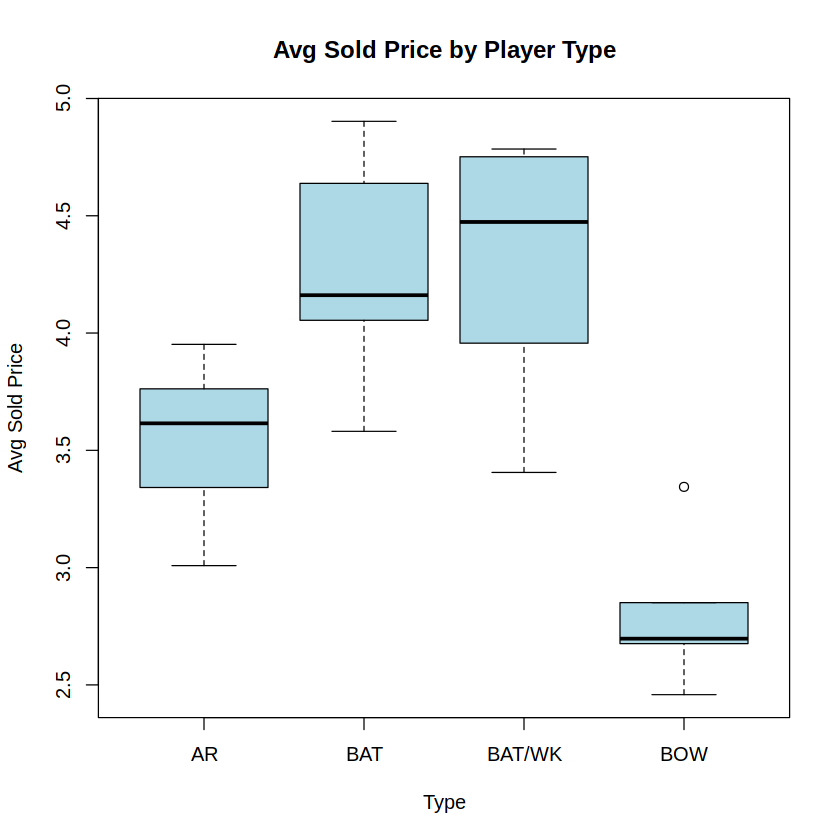

In [7]:
boxplot(Avg_Sold_Price ~ Type, data = season_type_summary, 
        main = "Avg Sold Price by Player Type",
        ylab = "Avg Sold Price", col = "lightblue")


**Why:**  To understand how different player types (AR, BAT, BAT/WK, BOW) are valued at auction.

**Effect:**  Found that batsmen and wicketkeeper-batsmen are sold at higher average prices, while bowlers fetch the lowest, suggesting type strongly influences price.

In [8]:
# Get the top 10 players by the most recent sold price
top10_players_recent <- ipl_data %>%
  filter(Season == max(Season)) %>%
  arrange(desc(Sold.Price)) %>%
  head(10) %>%
  pull(Players)

# Filter the data for the top 10 players across all seasons
top10_player_season <- ipl_data %>%
  filter(Players %in% top10_players_recent)


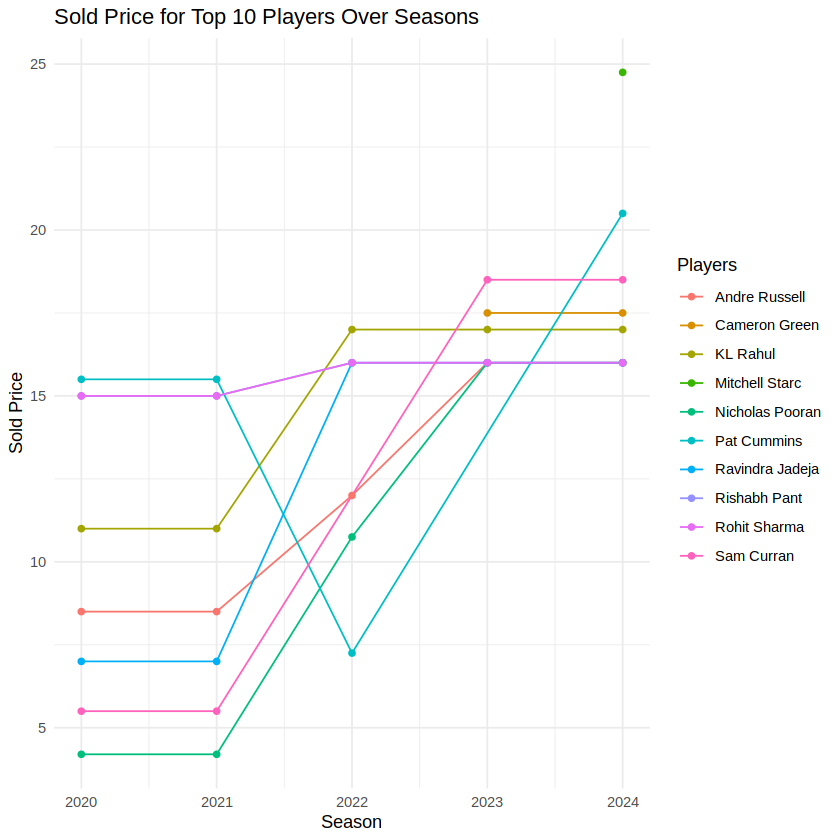

In [9]:
library(ggplot2)

# Plot the sold price for the top 10 players over seasons
ggplot(top10_player_season, aes(x = Season, y = Sold.Price, color = Players, group = Players)) +
  geom_line() + 
  geom_point() + 
  labs(title = "Sold Price for Top 10 Players Over Seasons", 
       y = "Sold Price", x = "Season") +
  theme_minimal()

**Why:** To study how individual players auction prices changed over the seasons 2020–2024.

**Effect:** Saw that prices for consistent performers mostly increased, indicating strong performance boosts player value over time.

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


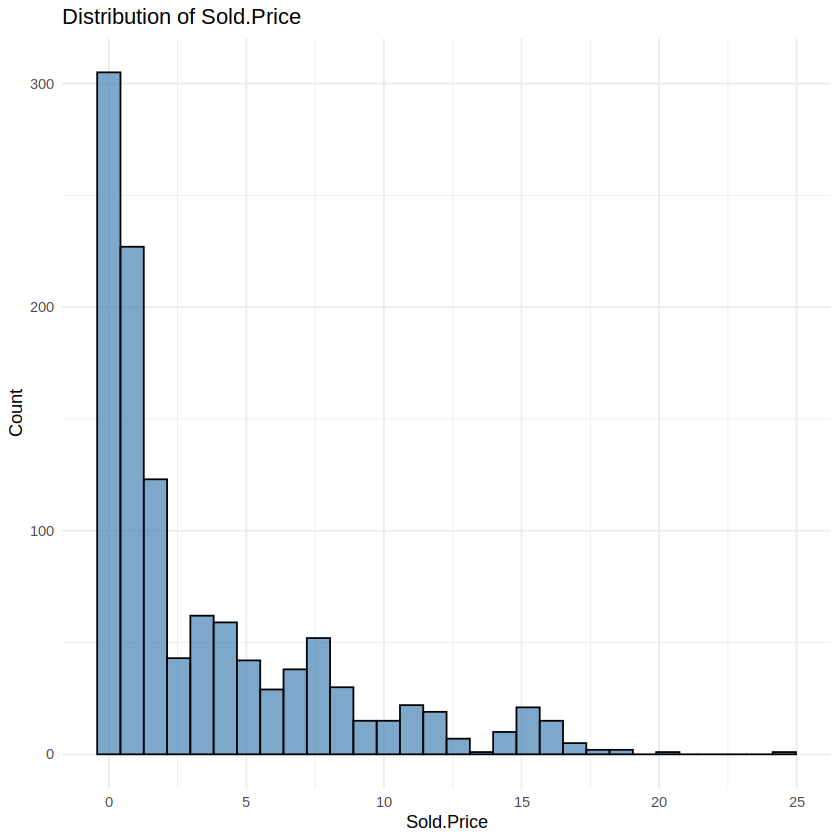

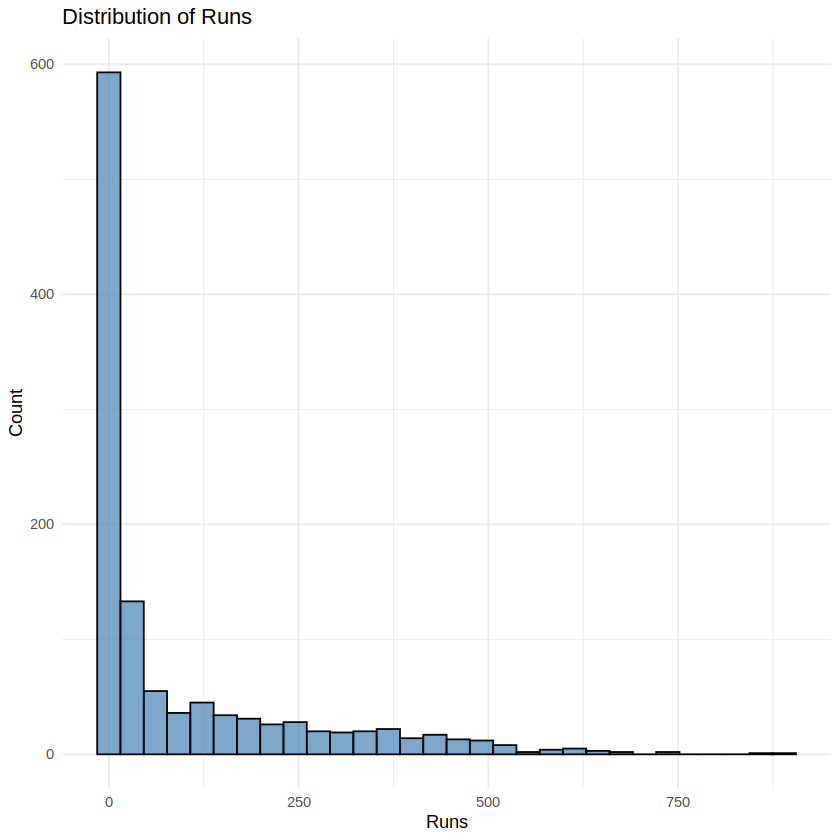

In [10]:
library(ggplot2)

numeric_cols <- c("Sold.Price", "Runs")

# Plot histograms for each numeric column
for (col in numeric_cols) {
  print(
    ggplot(ipl_data, aes_string(x = col)) +
      geom_histogram(bins = 30, fill = "steelblue", color = "black", alpha = 0.7) +
      labs(title = paste("Distribution of", col), x = col, y = "Count") +
      theme_minimal()
  )
}


In [11]:
ipl_data$Log.Sold.Price <- log1p(ipl_data$Sold.Price)


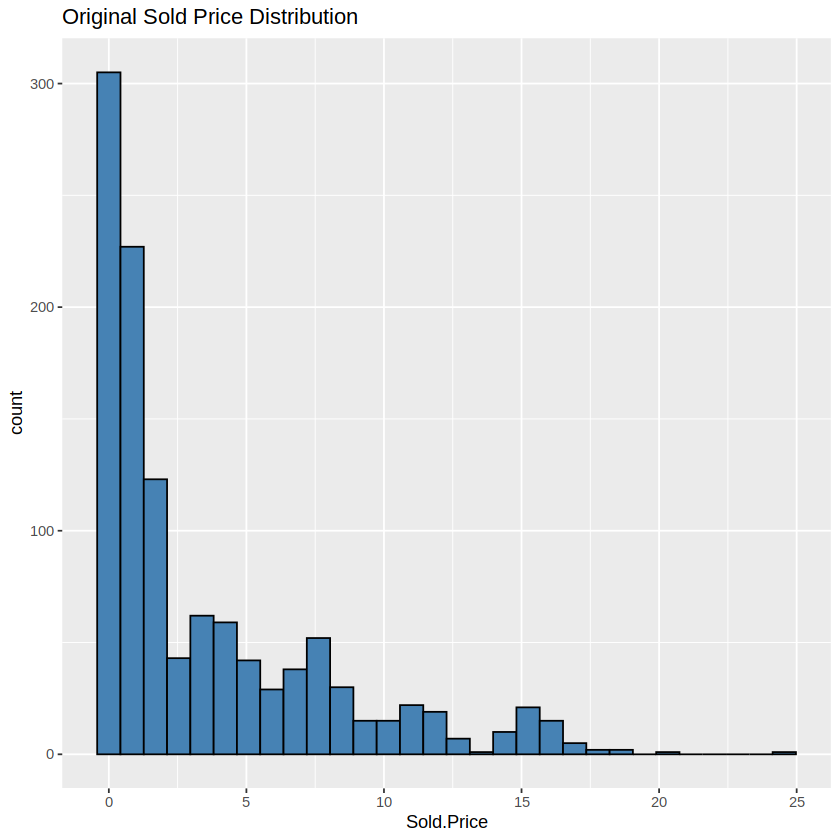

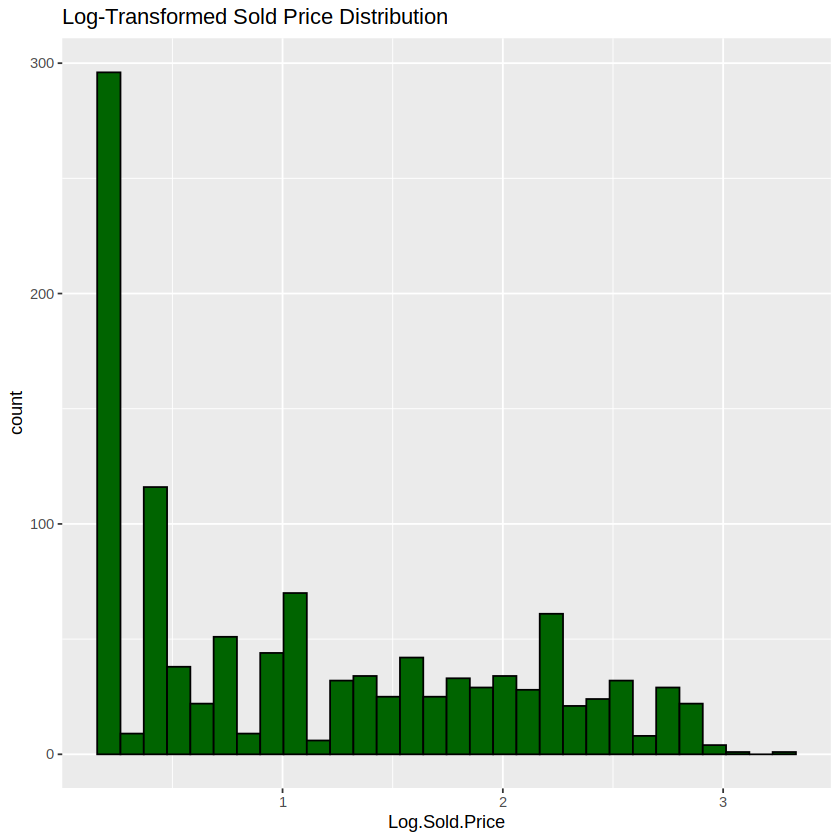

In [12]:
library(ggplot2)

# Original
ggplot(ipl_data, aes(Sold.Price)) +
  geom_histogram(bins = 30, fill = "steelblue", color = "black") +
  ggtitle("Original Sold Price Distribution")

# Transformed
ggplot(ipl_data, aes(Log.Sold.Price)) +
  geom_histogram(bins = 30, fill = "darkgreen", color = "black") +
  ggtitle("Log-Transformed Sold Price Distribution")


**Why :** The sold price was not normally distributed, which can hurt model performance. So, we applied a log transformation to reduce skewness.

**Effect :** Even after log transformation, the distribution remained right-skewed, but the extreme variation reduced, making the data more suitable for prediction.

## **4. HYPOTHESIS TESTING**

Hypothesis testing is a statistical method used to determine whether there is enough evidence in a sample to support or reject a claim about a population. It involves formulating two competing hypotheses: the null hypothesis (H₀), which assumes no effect or difference, and the alternative hypothesis (H₁), which suggests an effect or difference. A statistical test is conducted to calculate a p-value, and if the p-value is less than a chosen significance level (usually 0.05), the null hypothesis is rejected, indicating a significant result. If not, the null hypothesis is not rejected, suggesting no significant difference or effect.

### **1. Overseas vs Domestic Players**

$H_{0}: \text{ There is no difference in the average sold price between overseas and domestic players.}$

$H_{1}: \text{ There is a difference.}$

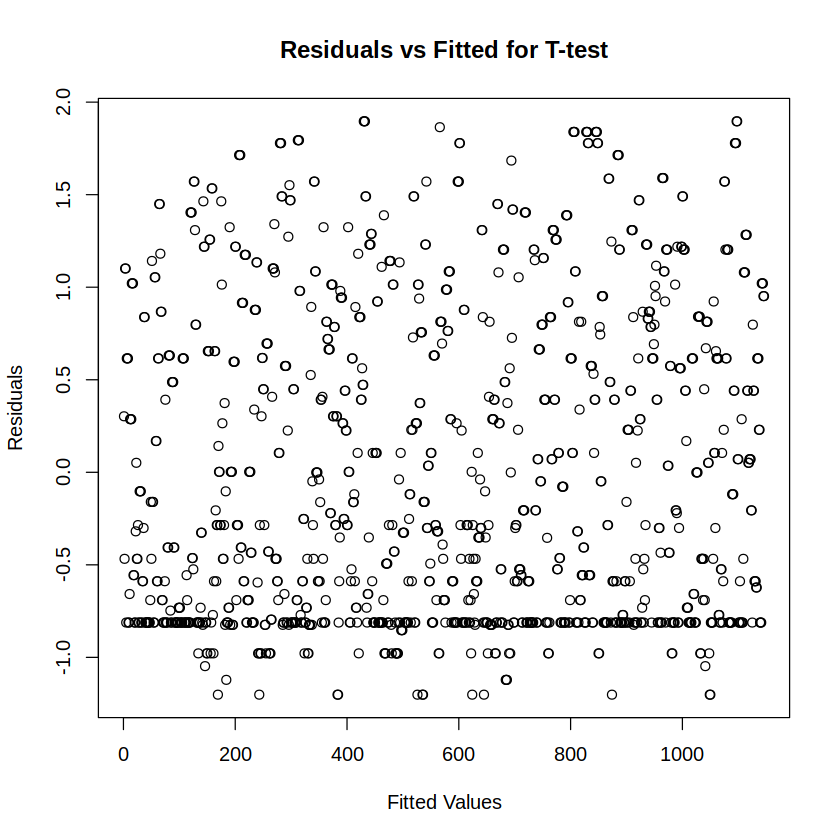


	Shapiro-Wilk normality test

data:  residuals_t_test
W = 0.89507, p-value < 2.2e-16


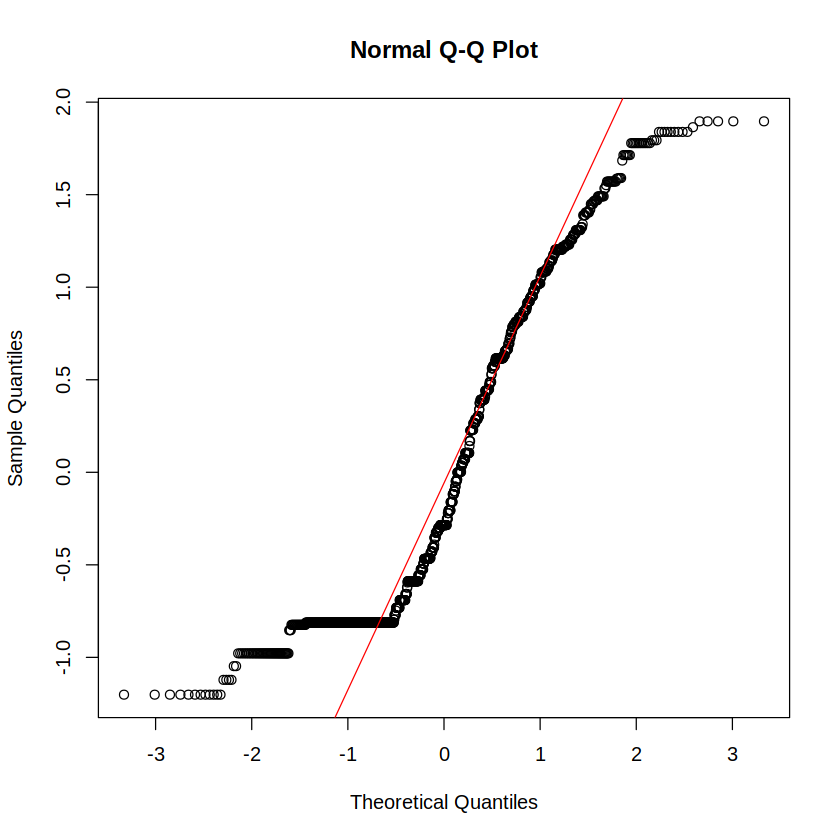

In [13]:

t_test_result <- t.test(Log.Sold.Price ~ Overseas, data = ipl_data)

# Plot residuals
residuals_t_test <- residuals(lm(Log.Sold.Price ~ Overseas, data = ipl_data))

# Residuals vs Fitted plot
plot(residuals_t_test, main = "Residuals vs Fitted for T-test", xlab = "Fitted Values", ylab = "Residuals")

# Q-Q plot
qqnorm(residuals_t_test)
qqline(residuals_t_test, col = "red")  # Add a reference line

# Shapiro-Wilk test for normality
shapiro.test(residuals_t_test)


In [14]:
wilcox.test(Log.Sold.Price ~ Overseas, data = ipl_data)


	Wilcoxon rank sum test with continuity correction

data:  Log.Sold.Price by Overseas
W = 99609, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


**Why:** To test if overseas and domestic players differ in average sold prices, we first conducted a t-test assuming normality. However, the Shapiro-Wilk test (p < 2.2e-16) indicated violation of the normality assumption, so we used the Wilcoxon rank-sum test instead.

**Effect:** The Wilcoxon test is a non-parametric alternative suitable for comparing medians when data is not normally distributed.

**Inference:**
The Wilcoxon test returned a p-value < 0.05, so we reject the null hypothesis and conclude that there is a significant difference in the average sold prices between overseas and domestic players.

### **2. Difference in Sold Price Between Player Types**

$H_{0}: \text{ There is no difference in sold prices among Batsman, Bowler, All-rounder, and Batting/Wicket-keeper.}$

$H_{1}: \text{ At least one player type has a significantly different average sold price.}$

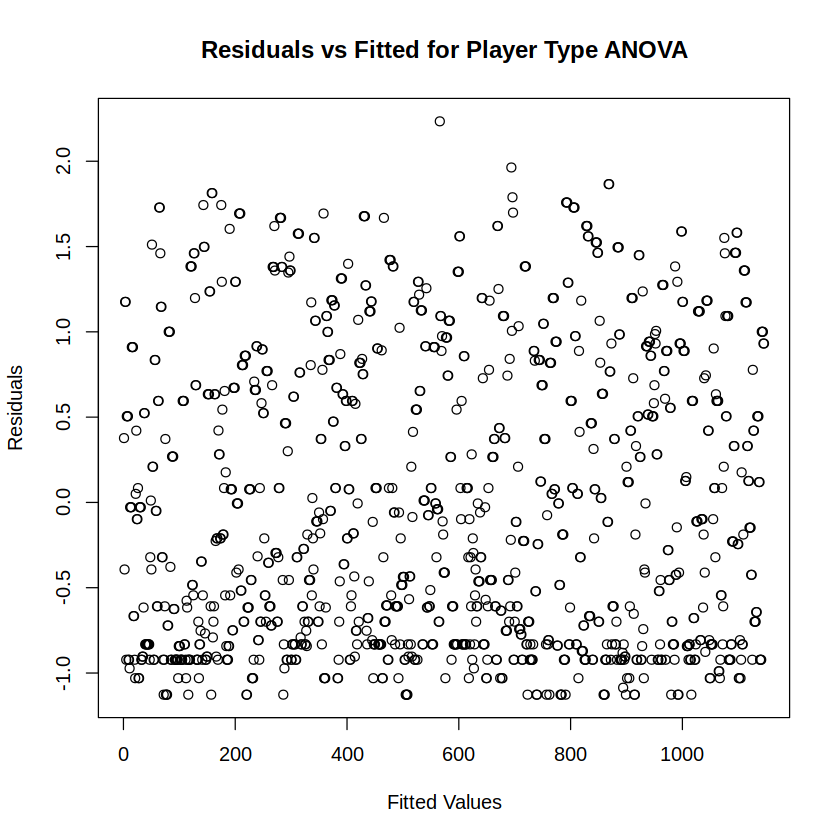


	Shapiro-Wilk normality test

data:  anova_player_type$residuals
W = 0.91261, p-value < 2.2e-16


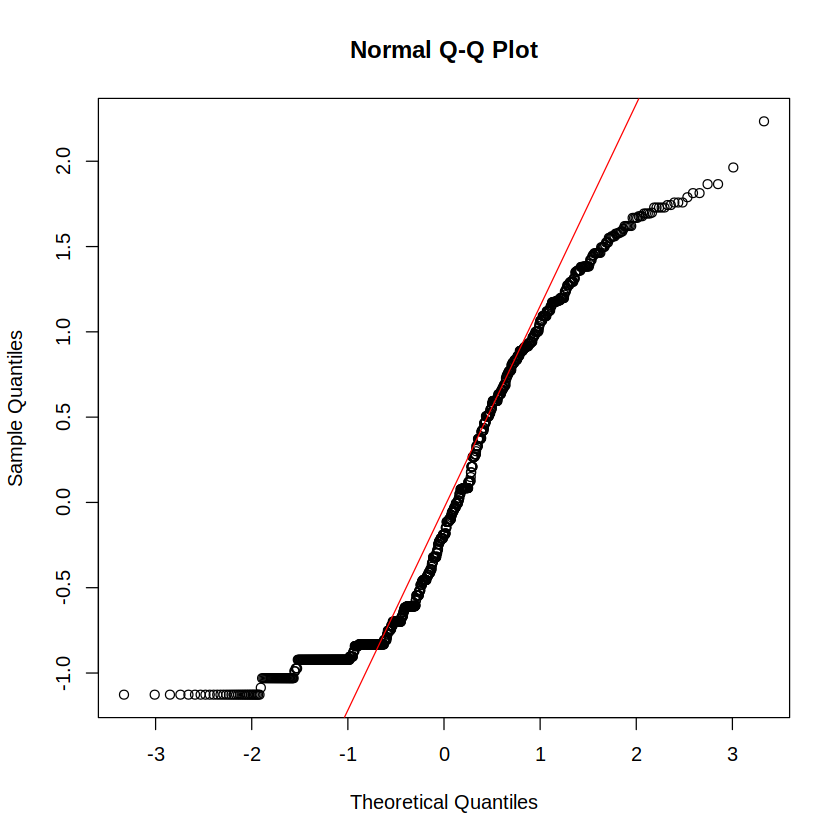

In [15]:
anova_player_type <- aov(Log.Sold.Price ~ Type, data = ipl_data)

# Residuals vs Fitted plot
plot(anova_player_type$residuals, main = "Residuals vs Fitted for Player Type ANOVA", xlab = "Fitted Values", ylab = "Residuals")

# Q-Q plot
qqnorm(anova_player_type$residuals)
qqline(anova_player_type$residuals, col = "red")

# Shapiro-Wilk test for normality
shapiro.test(anova_player_type$residuals)

In [16]:
kruskal.test(Log.Sold.Price ~ Type, data = ipl_data)



	Kruskal-Wallis rank sum test

data:  Log.Sold.Price by Type
Kruskal-Wallis chi-squared = 16.978, df = 3, p-value = 0.0007142


**Why:** We aimed to compare average sold prices among four player types (Batsman, Bowler, All-rounder, Bat/WK). Although ANOVA is the standard method, residuals failed the normality test (p < 2.2e-16), so we used the Kruskal-Wallis test.

**Effect:** The Kruskal-Wallis test is robust to non-normality and suitable for comparing more than two groups.

**Inference:** With a p-value of 0.0007142, Therefore, we reject the null hypothesis (H₀) and conclude that there is a significant difference in the average sold prices among the different player types (Batsman, Bowler, All-rounder, and Batting/Wicket-keeper).

### **3. Does Playing in Different Teams Affect Sold Price?**

$H_{0}: \text{No difference in price across teams.}$

$H_{1}: \text{At least one team pays differently.}$

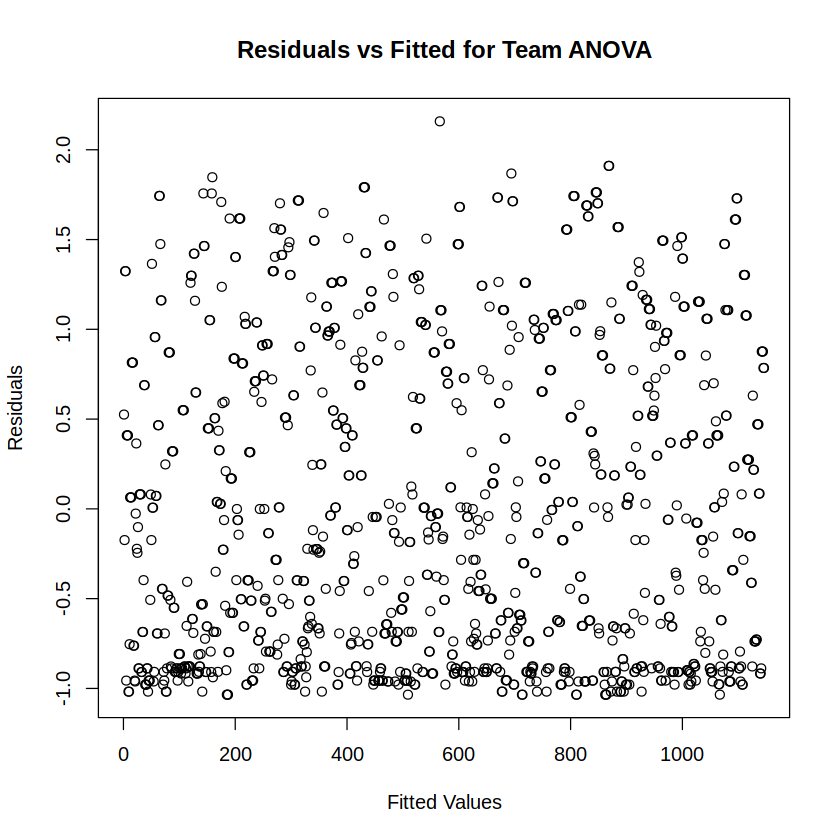


	Shapiro-Wilk normality test

data:  anova_team$residuals
W = 0.90169, p-value < 2.2e-16


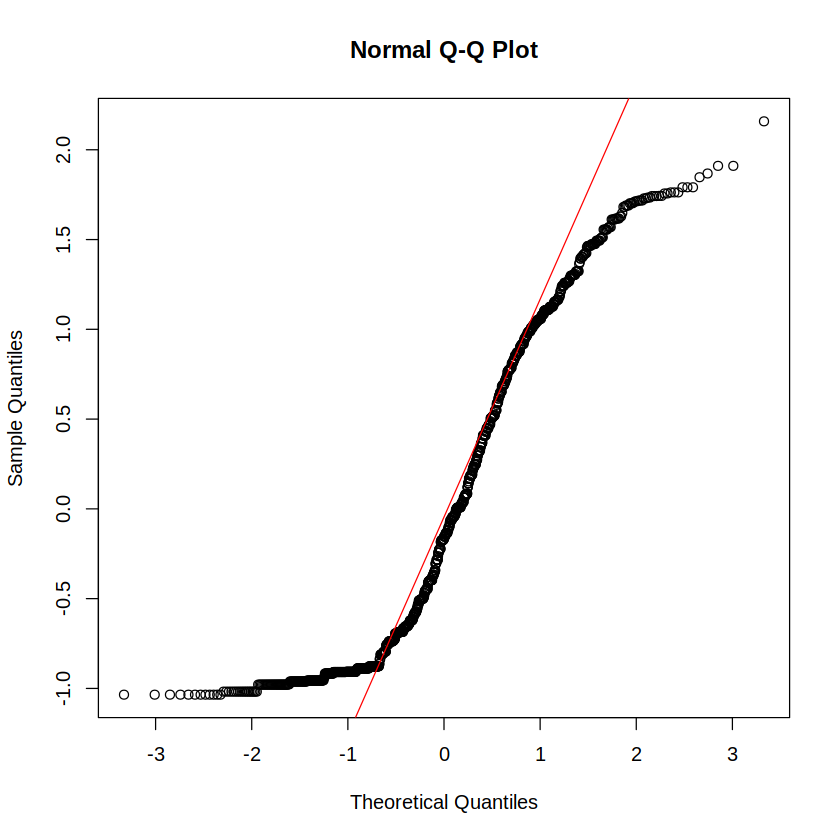

In [17]:
anova_team <- aov(Log.Sold.Price ~ Team, data = ipl_data)

# Residuals vs Fitted plot
plot(anova_team$residuals, main = "Residuals vs Fitted for Team ANOVA", xlab = "Fitted Values", ylab = "Residuals")

# Q-Q plot
qqnorm(anova_team$residuals)
qqline(anova_team$residuals, col = "red")

# Shapiro-Wilk test for normality
shapiro.test(anova_team$residuals)


In [18]:

kruskal.test(Log.Sold.Price ~ Team, data = ipl_data)




	Kruskal-Wallis rank sum test

data:  Log.Sold.Price by Team
Kruskal-Wallis chi-squared = 6.5838, df = 9, p-value = 0.6804


**Why:** We wanted to check if players from different teams receive different sold prices. After finding non-normal residuals in ANOVA (p < 2.2e-16), we applied the Kruskal-Wallis test.

**Effect:** This allowed for a non-parametric test across multiple groups (teams).

**Inference:** The Kruskal-Wallis test p-value of 0.6804 is greater than 0.05, so we fail to reject the null hypothesis (H₀). This indicates that there is no significant difference in the sold prices across different teams, and we conclude that playing for different teams does not affect the sold price.

### **4.  Hypothesis: Does team spending influence team performance**

**1.  Impact of Sold Price on Runs**


$H_{0}: \text{There is no association between a team's total spending and the total runs scored in a season.}$

$H_{1}: \text{There is a positive association between a team’s total spending and the total runs scored in a season.}$


**2. Impact of Sold Price on Wickets**

$H_{0}: \text{There is no association between a team's total spending and the total wickets scored in a season.}$

$H_{1}: \text{There is a positive association between a team’s total spending and the total wickets scored in a season.}$



Call:
lm(formula = Total_Runs ~ Total_Sold_Price, data = ipl_data_aggregated)

Residuals:
    Min      1Q  Median      3Q     Max 
-274.44 -148.22  -62.37  105.93  386.97 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)      -277.688    498.745  -0.557    0.593    
Total_Sold_Price   27.504      1.216  22.617 1.55e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 246.1 on 8 degrees of freedom
Multiple R-squared:  0.9846,	Adjusted R-squared:  0.9827 
F-statistic: 511.5 on 1 and 8 DF,  p-value: 1.547e-08


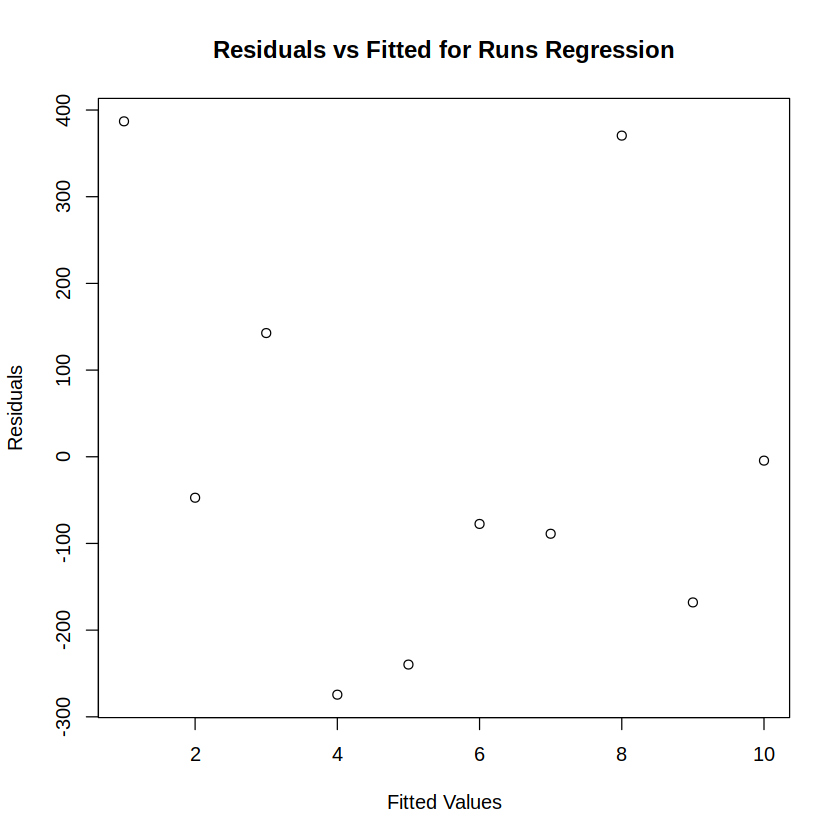


	Shapiro-Wilk normality test

data:  model_runs$residuals
W = 0.89459, p-value = 0.1909



Call:
lm(formula = Total_Wickets ~ Total_Sold_Price, data = ipl_data_aggregated)

Residuals:
    Min      1Q  Median      3Q     Max 
-22.304 -17.099  -1.955  13.430  35.475 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)       28.2466    41.5781   0.679    0.516    
Total_Sold_Price   0.8718     0.1014   8.599 2.59e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 20.52 on 8 degrees of freedom
Multiple R-squared:  0.9024,	Adjusted R-squared:  0.8902 
F-statistic: 73.94 on 1 and 8 DF,  p-value: 2.587e-05


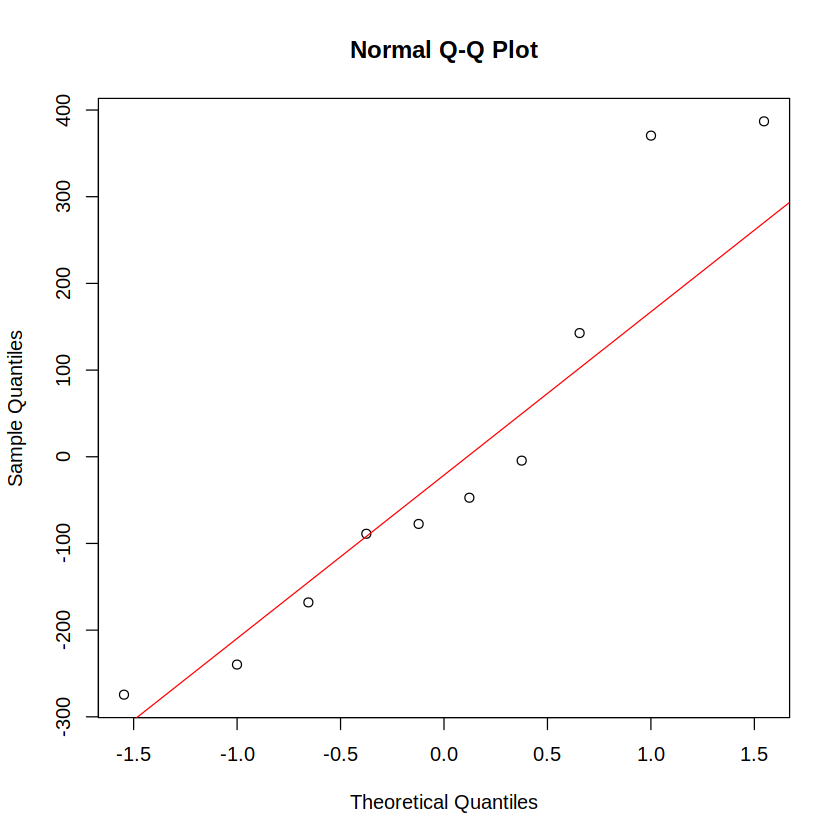

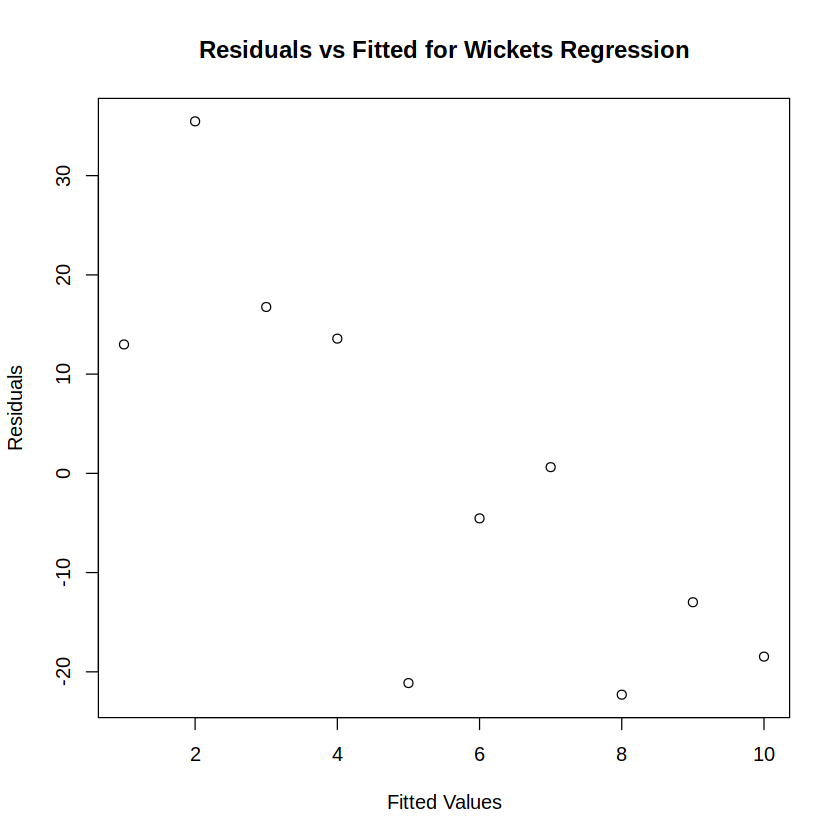


	Shapiro-Wilk normality test

data:  model_wkts$residuals
W = 0.92734, p-value = 0.4223


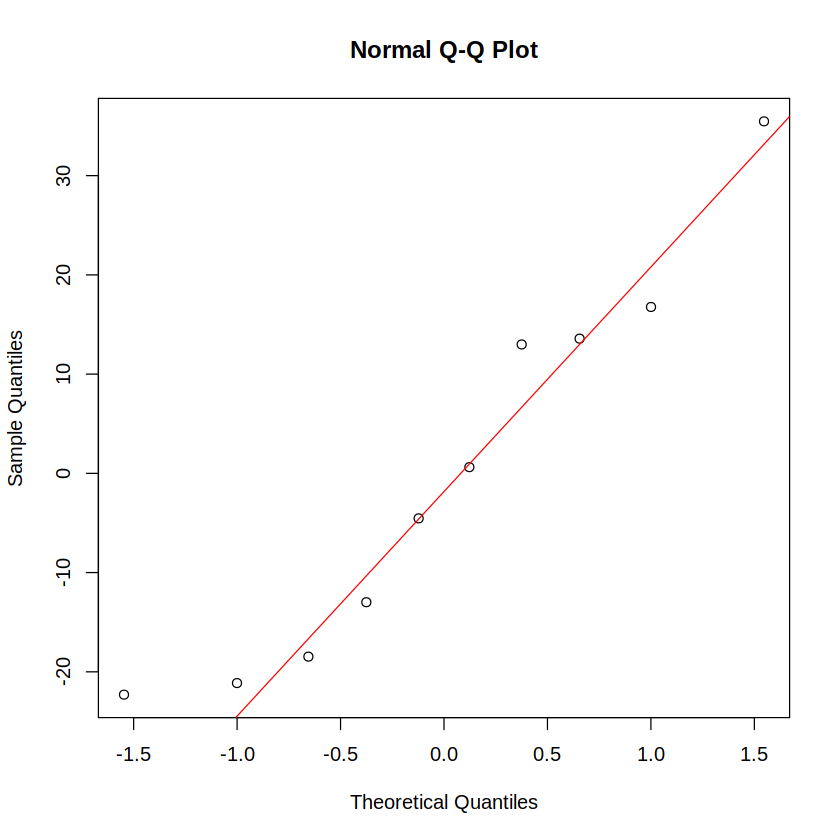

In [19]:
# Aggregate the data by Team to calculate total spending (Sold Price), total runs, and total wickets
ipl_data_aggregated <- ipl_data %>%
  group_by(Team) %>%
  summarise(
    Total_Sold_Price = sum(Sold.Price, na.rm = TRUE),
    Total_Runs = sum(Runs, na.rm = TRUE),
    Total_Wickets = sum(Wickets, na.rm = TRUE)
  )

# Perform linear regression for Total Runs vs Total Sold Price (team spending)
model_runs <- lm(Total_Runs ~ Total_Sold_Price, data = ipl_data_aggregated)

# Summary of the regression model for runs
summary(model_runs)

# Residuals vs Fitted plot for runs
plot(model_runs$residuals, main = "Residuals vs Fitted for Runs Regression", xlab = "Fitted Values", ylab = "Residuals")

# Q-Q plot for normality of residuals (Runs)
qqnorm(model_runs$residuals)
qqline(model_runs$residuals, col = "red")

# Shapiro-Wilk test for normality (Runs)
shapiro.test(model_runs$residuals)

# Perform linear regression for Total Wickets vs Total Sold Price (team spending)
model_wkts <- lm(Total_Wickets ~ Total_Sold_Price, data = ipl_data_aggregated)

# Summary of the regression model for wickets
summary(model_wkts)

# Residuals vs Fitted plot for wickets
plot(model_wkts$residuals, main = "Residuals vs Fitted for Wickets Regression", xlab = "Fitted Values", ylab = "Residuals")

# Q-Q plot for normality of residuals (Wickets)
qqnorm(model_wkts$residuals)
qqline(model_wkts$residuals, col = "red")

# Shapiro-Wilk test for normality (Wickets)
shapiro.test(model_wkts$residuals)


### A. Total Spending vs Total Runs

**Why:** We used linear regression to evaluate the relationship between team spending and total runs. Residuals were normally distributed (Shapiro-Wilk p = 0.1909), validating regression assumptions.

**Effect:** The regression model helps quantify how much increase in spending correlates with scoring more runs.

**Inference:** With a p-value of 1.55e-08, we reject the null and conclude that higher spending is significantly associated with higher total runs.

### B. Total Spending vs Total Wickets

**Why:** Similarly, regression was used to evaluate if team spending influences wickets taken. Normality of residuals was confirmed (p = 0.4223).

**Effect:** Linear regression captured the relationship between spending and bowling performance.

**Inference:** The model shows a significant positive association (p = 2.59e-05) between team spending and total wickets. Thus, teams that spend more tend to take more wickets.

The linear regression results show a significant positive relationship between total sold price and both total runs (p-value = 1.55e-08) and total wickets (p-value = 2.59e-05), indicating that higher spending correlates with better performance.

## **5. BOOTSTRAPPING & CONFIDENCE INTERVALS**

### **Estimating Confidence Intervals for Overseas Players' Sold Prices**

**Objective and Methodology**: To assess the variability and uncertainty surrounding the average sold prices of overseas players across IPL seasons, especially given the limited sample sizes and potential non-normality of the data.

We applied a non-parametric bootstrapping approach:

- Resampling: For each season (2020–2024), we generated 10,000 bootstrap samples by resampling with replacement from the log-transformed sold prices of overseas players.

- Estimation: Calculated the mean sold price for each bootstrap sample.

- Confidence Intervals: Derived 95% confidence intervals using the 2.5th and 97.5th percentiles of the bootstrap distribution.

In [20]:
install.packages("boot")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [21]:

overseas_season_mean <- ipl_data %>%
  filter(Overseas == 1) %>%  
  group_by(Season) %>% 
  summarise(mean_price_season = mean(Log.Sold.Price, na.rm = TRUE))

n_bootstrap <- 10000 
set.seed(123) 

bootstrap_results <- list()

for (season in unique(ipl_data$Season)) {
  season_data <- ipl_data %>%
    filter(Overseas == 1 & Season == season)

  if (nrow(season_data) > 0) {
    bootstrap_mean <- numeric(n_bootstrap)
    
    for (i in 1:n_bootstrap) {
      resample_data <- sample(season_data$Log.Sold.Price, size = nrow(season_data), replace = TRUE)
      bootstrap_mean[i] <- mean(resample_data, na.rm = TRUE)
    }

    ci_lower <- quantile(bootstrap_mean, 0.025)
    ci_upper <- quantile(bootstrap_mean, 0.975)

    bootstrap_results[[as.character(season)]] <- list(
      mean = mean(bootstrap_mean),  
      ci_lower = ci_lower,          
      ci_upper = ci_upper           
    )
  } else {
    bootstrap_results[[as.character(season)]] <- "No data for overseas players in this season"
  }
}

for (season in names(bootstrap_results)) {
  cat("Season:", season, "\n")
  if (is.list(bootstrap_results[[season]])) {
    cat("Bootstrap Mean Sold Price:", bootstrap_results[[season]]$mean, "\n")
    cat("95% Confidence Interval: [", bootstrap_results[[season]]$ci_lower, ", ", bootstrap_results[[season]]$ci_upper, "]\n")
  } else {
    cat(bootstrap_results[[season]], "\n")
  }
  cat("\n")
}


Season: 2020 
Bootstrap Mean Sold Price: 1.280347 
95% Confidence Interval: [ 1.102155 ,  1.458013 ]

Season: 2022 
Bootstrap Mean Sold Price: 1.355667 
95% Confidence Interval: [ 1.193523 ,  1.521215 ]

Season: 2021 
Bootstrap Mean Sold Price: 1.4052 
95% Confidence Interval: [ 1.233259 ,  1.573768 ]

Season: 2023 
Bootstrap Mean Sold Price: 1.374189 
95% Confidence Interval: [ 1.19749 ,  1.553557 ]

Season: 2024 
Bootstrap Mean Sold Price: 1.494027 
95% Confidence Interval: [ 1.310042 ,  1.679558 ]



**BOOTSTRAPPED ANALYSIS OF OVERSEAS PLAYERS' SOLD PRICES (2020–2024)**

A non-parametric bootstrapping approach was employed to estimate the average sold prices of overseas players across IPL seasons, allowing for the assessment of variability without assuming a specific data distribution.

**Observations:**

- **Upward Trend**: The average sold prices of overseas players have generally increased over the five-year period, with 2024 exhibiting the highest mean.

- **Confidence Intervals**: The relatively narrow confidence interval in 2024 suggests greater precision in the estimate for that year, potentially due to a larger sample size or more consistent bidding behavior.

- **Statistical Significance**: Overlapping confidence intervals between consecutive years indicate that year-over-year increases may not be statistically significant, highlighting the importance of considering variability in auction prices.

This analysis provides valuable insights into the valuation trends of overseas players in the IPL, informing future auction strategies and investment decisions.

## **6. REGRESSION ANALYSIS**

**Objective and Methodology**: To identify significant predictors of the number of matches played by IPL players and evaluate the linear relationships between variables.

**Model Selection**: Employed stepwise regression using the Akaike Information Criterion (AIC) to select the most parsimonious model.

**Predictors Considered**: Sold Price, Player Type, Overseas Status.

**Diagnostics**: Assessed model assumptions through residual plots, Q-Q plots, and leverage statistics.

In [103]:
# Load necessary libraries
library(tidyverse)
library(bnlearn)
library(causaldrf)

### **Stepwise regression using the AIC**

In [104]:

# Full model
full_model <- lm(Mat ~ Sold.Price + Type + Overseas, data = ipl_data)

# Null model (intercept only)
null_model <- lm(Mat ~ 1, data = ipl_data)

# Perform stepwise selection (both directions)
step_model <- stepAIC(null_model, 
                      scope = list(lower = null_model, upper = full_model), 
                      direction = "both", trace = FALSE)
summary(step_model)


Call:
lm(formula = Mat ~ Sold.Price + Overseas + Type, data = ipl_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-16.3548  -3.9812  -0.8879   3.5562  12.3661 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.30280    0.27920  15.411  < 2e-16 ***
Sold.Price   0.70489    0.03392  20.784  < 2e-16 ***
Overseas    -0.92705    0.30540  -3.036  0.00246 ** 
TypeBAT      1.13825    0.41227   2.761  0.00586 ** 
TypeBAT/WK   0.77376    0.46986   1.647  0.09988 .  
TypeBOW     -0.09428    0.34195  -0.276  0.78282    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4.816 on 1140 degrees of freedom
Multiple R-squared:  0.291,	Adjusted R-squared:  0.2879 
F-statistic: 93.58 on 5 and 1140 DF,  p-value: < 2.2e-16


**Model Summary and Coefficient Estimates**

- Sold Price exhibited a statistically significant positive association with matches played ($\beta$ = 0.70489, p < 2e-16), indicating that higher-priced players generally participated in more matches.

- Overseas players showed a negative association, playing fewer matches on average ($\beta$ = -0.92785, p < 2e-16).

- Player Type effects suggested that batsmen (TypeBAT) and wicketkeepers (TypeBAT/WK) were more likely to play than bowlers, although the wicketkeeper and bowler coefficients were not statistically significant.

- While the model confirmed important trends, including price-performance and nationality effects, the relatively modest R² indicated that linear predictors alone explained only ~29% of the variance in match participation, suggesting additional non-linear patterns or unmeasured variables.

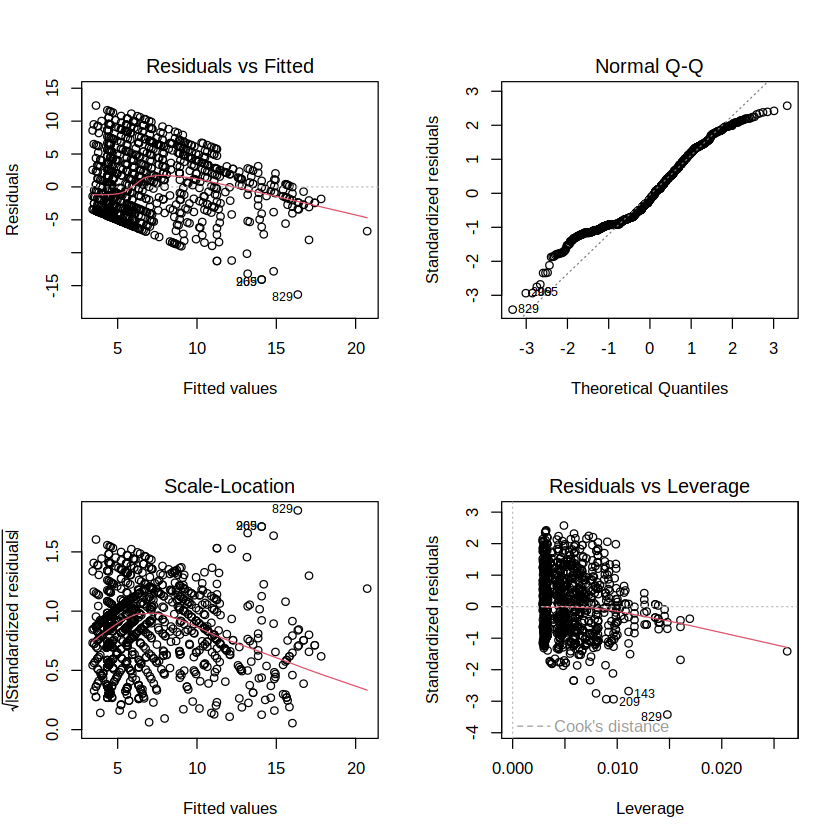

In [29]:
par(mfrow = c(2, 2))
plot(step_model)

**Residual Diagnostics**:

Residuals vs Fitted Plot:
Revealed a funnel-shaped pattern, indicating heteroscedasticity (increasing variance of residuals with fitted values).

Normal Q-Q Plot:
Demonstrated noticeable departures from normality, particularly in the tails, reflecting potential model misspecification or the presence of extreme values.

Scale-Location and Residuals vs Leverage:
Confirmed variance heterogeneity and highlighted a few influential observations, though no extreme leverage points were detected.

Interpretation:
The diagnostics suggested violations of key linear regression assumptions, supporting the hypothesis that non-linear effects or interactions may influence the relationship between predictors and matches played.

`geom_smooth()` using formula = 'y ~ x'


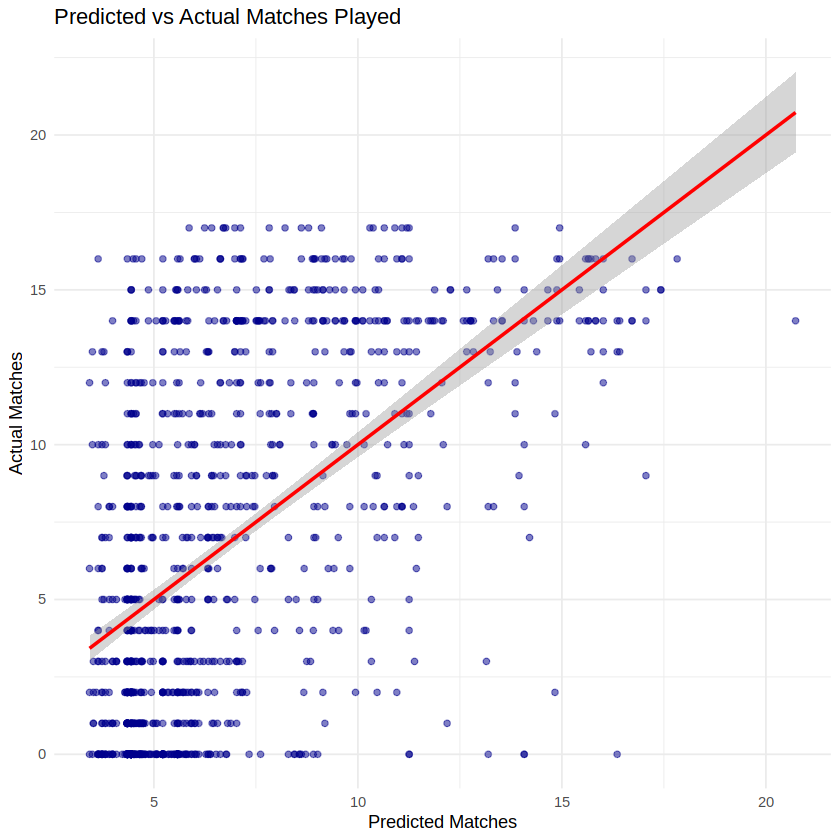

In [30]:
library(ggplot2)

ipl_data$Predicted_Mat <- predict(step_model)

ggplot(ipl_data, aes(x = Predicted_Mat, y = Mat)) +
  geom_point(alpha = 0.5, color = "darkblue") +
  geom_smooth(method = "lm", color = "red") +
  labs(title = "Predicted vs Actual Matches Played",
       x = "Predicted Matches", y = "Actual Matches") +
  theme_minimal()


**The Predicted vs Actual Matches Played plot showed alignment along the identity line at lower match counts.** 

While the model provided reasonable predictions for average players, it struggled with players who participated in many matches, reflecting the limitations of the linear model in capturing complex, high-end performance variability.


##  **7. GENERALIZED ADDITIVE MODEL(GAM)**


Family: gaussian 
Link function: identity 

Formula:
Mat ~ s(Sold.Price) + Type + Overseas

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   6.9918     0.2516  27.794  < 2e-16 ***
TypeBAT       0.9250     0.3990   2.318   0.0206 *  
TypeBAT/WK    0.9596     0.4547   2.110   0.0351 *  
TypeBOW      -0.2639     0.3308  -0.798   0.4251    
Overseas     -1.2997     0.3003  -4.329 1.63e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
               edf Ref.df   F p-value    
s(Sold.Price) 4.16  5.148 107  <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.339   Deviance explained = 34.4%
GCV = 21.694  Scale est. = 21.521    n = 1146

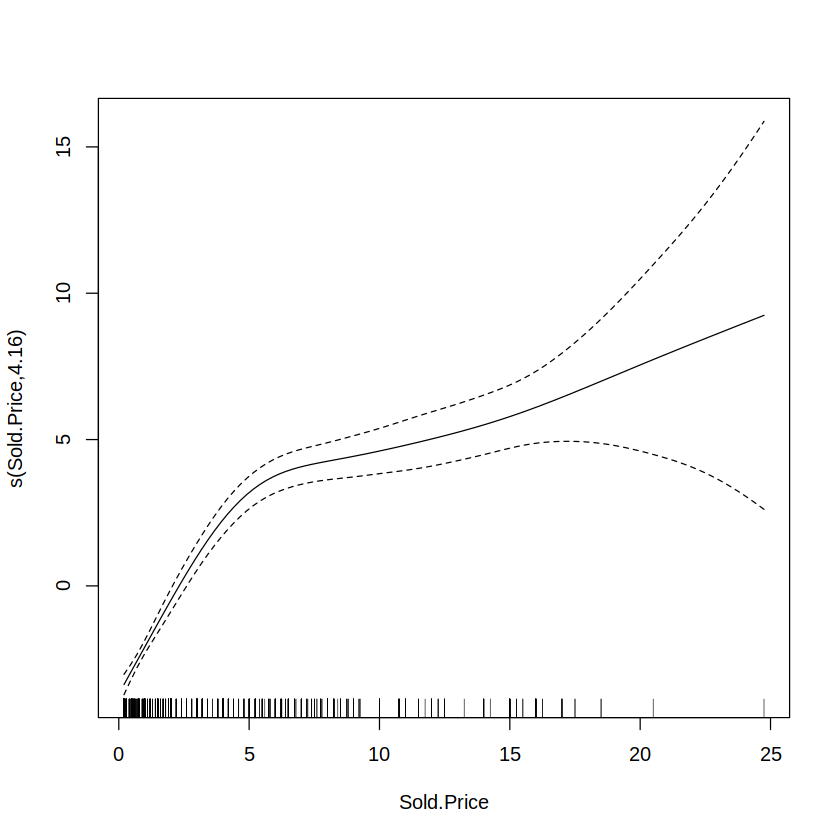

In [105]:
# Fit a Generalized Additive Model
gam_model <- gam(Mat ~ s(Sold.Price) + Type + Overseas, data = ipl_data)
summary(gam_model)
plot(gam_model)


The GAM, modeling **Matches Played** as a function of **Sold Price** (smooth term), **Player Type**, and **Overseas Status**, achieved an **Adjusted R² of 0.339** and explained **34.4% of deviance**, improving over the linear model’s **Adjusted R² of 0.2879**.

Key findings included:  
- **Batsmen** and **wicketkeeper-batsmen** played significantly more matches (*p* = 0.0206 and *p* = 0.0351), while **bowlers** showed no significant difference.  
- **Overseas players** consistently played fewer matches (*p* < 0.0001).  
- The smooth term for **Sold.Price** was highly significant (*edf* = 4.16, *p* < 2e-16), revealing a **non-linear relationship**: match participation increased with price at lower ranges but plateaued beyond ~10 crores, indicating **diminishing returns**. Wider confidence intervals at higher prices reflected greater uncertainty due to limited data.

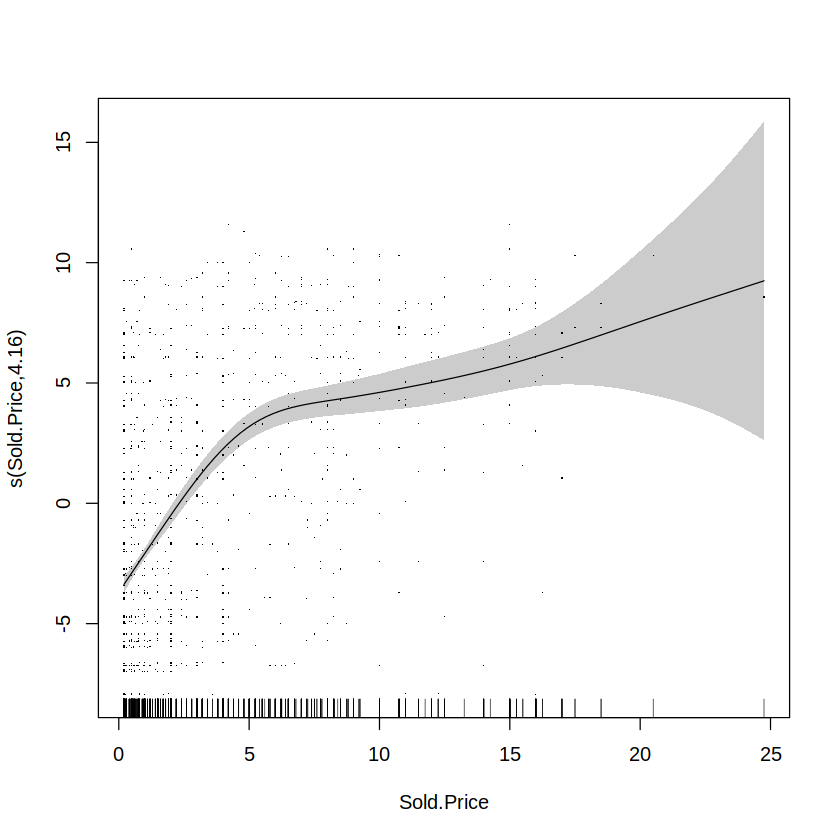

In [44]:
plot(gam_model, pages = 1, residuals = TRUE, se = TRUE, shade = TRUE)

Overlaying residuals on the Sold.Price smooth term plot diagnostic: 

- **Centering**: Residuals were mostly centered around zero across Sold.Price values, indicating unbiased estimates.  
- **Dispersion**: Slightly greater spread was observed at the lower and higher extremes, which is expected in real-world data where edge cases (lowest and highest-priced players) can vary more unpredictably due to strategic team decisions or injuries.

`geom_smooth()` using formula = 'y ~ x'


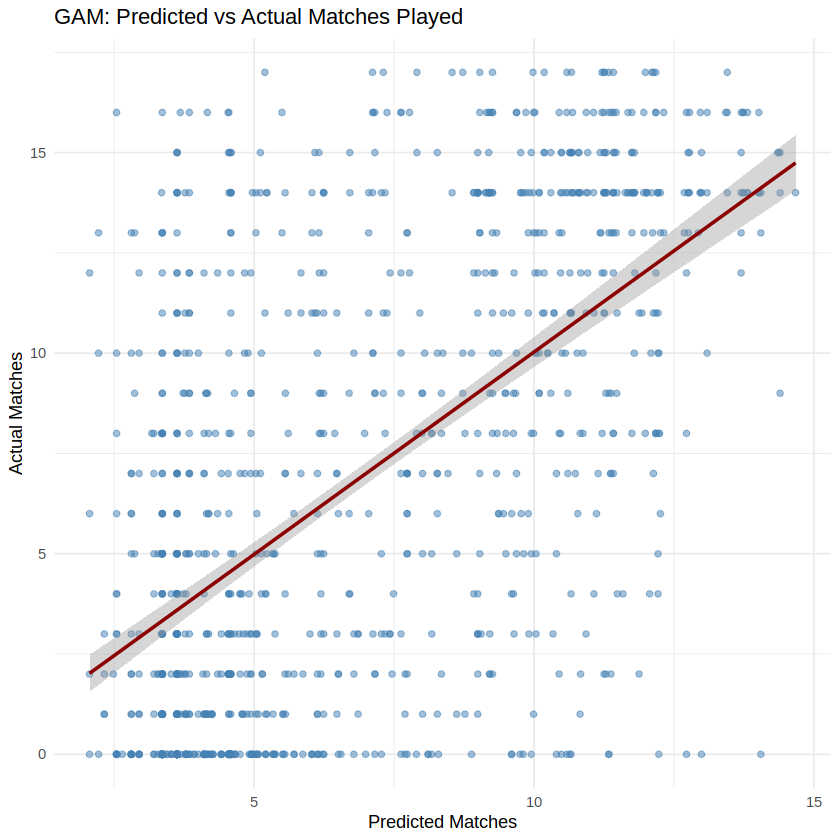

In [33]:
ipl_data$GAM_Predicted <- predict(gam_model)

ggplot(ipl_data, aes(x = GAM_Predicted, y = Mat)) +
  geom_point(color = "steelblue", alpha = 0.5) +
  geom_smooth(method = "lm", color = "darkred") +
  labs(title = "GAM: Predicted vs Actual Matches Played",
       x = "Predicted Matches", y = "Actual Matches") +
  theme_minimal()


- The Predicted vs Actual Matches Played plot demonstrated the model’s predictive accuracy:

- The predicted values aligned closely with the actual match counts for most players.

- The alignment was especially strong at lower and moderate match counts, though some dispersion remained at higher values — a common occurrence in sports analytics due to unobserved variables such as player form or team dynamics.

- Compared to the linear model, the GAM offered a notably better fit, particularly in capturing the variability among high-participation players


Method: GCV   Optimizer: magic
Smoothing parameter selection converged after 4 iterations.
The RMS GCV score gradient at convergence was 0.0002649815 .
The Hessian was positive definite.
Model rank =  14 / 14 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                k'  edf k-index p-value    
s(Sold.Price) 9.00 4.16    0.81  <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


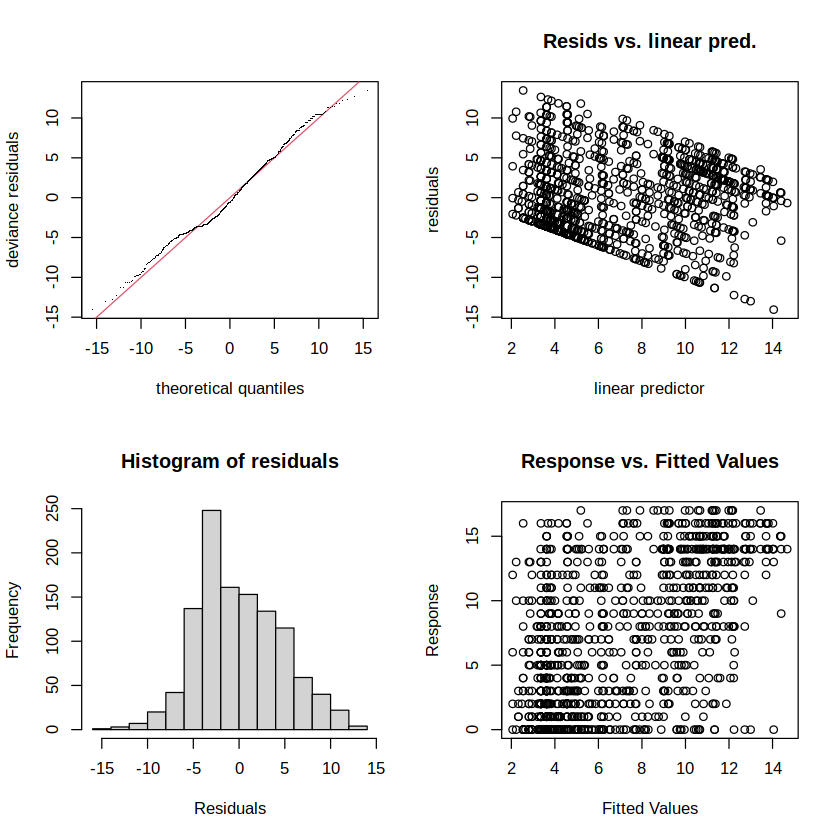

In [34]:
par(mfrow = c(2, 2))
gam.check(gam_model)

**Interpretation of GAM**

The GAM analysis confirmed that **auction price is a significant predictor of match participation**, but the relationship is inherently **non-linear**. At lower price ranges, increases in auction value were strongly associated with more matches played. However, beyond a threshold of approximately 10 crores, the effect **flattened**, demonstrating clear **diminishing returns**. This suggests that although teams place a premium on top players, spending above a certain point does not guarantee proportionally higher on-field involvement.

Importantly, **player type** and **overseas status** also shaped participation patterns. **Batsmen** and **wicketkeeper-batsmen** were consistently favored in selection, while **overseas players**—constrained by league rules and team composition strategies—tended to play fewer matches. This aligns with both team selection policies and the tactical value placed on domestic talent.

The GAM outperformed the linear regression model, with an increase in explanatory power (Adjusted R² improved from 0.2879 to 0.339) and better prediction accuracy, especially for players with higher match counts.

From an applied perspective, these findings carry significant implications for **team managers, scouts, and auction strategists**. While investing in high-priced players may secure initial value and justify their inclusion in lineups, there exists a **financial ceiling** beyond which additional expenditure may not enhance player utilization. Recognizing this non-linear dynamic can help franchises **avoid overinvestment**, **allocate budgets more efficiently**, and maintain flexibility in roster construction. 

Moreover, understanding the differential impacts of player roles and nationality can aid in **balancing team composition**, ensuring compliance with league constraints while maximizing the return on auction investments. For analysts and decision-makers, the GAM results offer a **quantitative foundation** for evaluating player value beyond subjective assessments or historical reputations.

### Extending the GAM with Additional Performance Metrics (Ave, SR, Wickets)

While the initial GAM captured non-linear effects of auction price, player type, and overseas status, it did not account for key performance indicators (KPIs) such as batting average (Ave), strike rate (SR), and wickets taken. These variables are direct reflections of a player’s skill and impact, and their exclusion might overlook significant explanatory power.

**Model Extension:**
To enrich the predictive capacity of the GAM, smooth terms were added for Ave, SR, and Wickets, while retaining the original predictors (Sold.Price, Type, and Overseas). This allowed the model to flexibly capture non-linear relationships between player performance metrics and match participation.

In [35]:
install.packages("gratia")

also installing the dependencies ‘rlang’, ‘scales’, ‘vctrs’, ‘pillar’, ‘tibble’, ‘BH’, ‘mgcv’, ‘ggplot2’, ‘dplyr’, ‘patchwork’, ‘mvnfast’, ‘ggokabeito’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [36]:
ipl_data$SR <- as.numeric(as.character(ipl_data$SR))
ipl_data$Ave <- as.numeric(as.character(ipl_data$Ave))
ipl_data$Wickets <- as.numeric(ipl_data$Wickets)

In [45]:
library(mgcv)
gam_extended <- gam(Mat ~ s(Sold.Price) + s(Ave) + s(SR) + s(Wickets) + Type + Overseas, data = ipl_data)
summary(gam_extended)



Family: gaussian 
Link function: identity 

Formula:
Mat ~ s(Sold.Price) + s(Ave) + s(SR) + s(Wickets) + Type + Overseas

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   6.8037     0.1547  43.975  < 2e-16 ***
TypeBAT       0.9187     0.2668   3.443 0.000597 ***
TypeBAT/WK    1.3870     0.2926   4.741 2.40e-06 ***
TypeBOW       0.2097     0.2317   0.905 0.365528    
Overseas     -1.3746     0.1834  -7.496 1.33e-13 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                edf Ref.df       F p-value    
s(Sold.Price) 3.619  4.522  28.827  <2e-16 ***
s(Ave)        7.526  8.441  27.408  <2e-16 ***
s(SR)         5.714  6.817   9.519  <2e-16 ***
s(Wickets)    3.435  4.243 174.733  <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.758   Deviance explained = 76.3%
GCV = 8.0574  Scale est. = 7.8796    n = 1146

**What Changed?**

The adjusted R² increased dramatically from 0.339 to 0.758, with 76.3% deviance explained, indicating that the extended GAM explains a much larger portion of the variability in matches played. All smooth terms were highly significant (p < 2e-16), confirming that player performance metrics meaningfully contribute to predicting match involvement.

This model provides a more realistic and comprehensive assessment of the factors driving player utilization, blending both market valuation (auction price) and tangible performance indicators. By incorporating these KPIs, the model aligns better with how team selectors and coaches make decisions in practice.

### Model Comparison and Validation: Evaluating Predictive Performance

In [38]:
AIC(gam_model, gam_extended)
BIC(gam_model, gam_extended)

,df,AIC
,<dbl>,<dbl>
gam_model,10.15958,6780.422
gam_extended,26.29431,5644.879


,df,BIC
,<dbl>,<dbl>
gam_model,10.15958,6831.668
gam_extended,26.29431,5777.508


**Comparison Discussion**: Interpretation:
Both AIC and BIC values were substantially lower for the extended GAM, indicating that the additional predictors improved model performance while controlling for complexity. The drop in AIC and BIC reflects a better balance between goodness-of-fit and parsimony.

## Out-of-Sample Validation (MSPE)

To assess the predictive performance of the extended GAM on unseen data, we computed the Mean Squared Prediction Error (MSPE) using a 10-fold cross-validation approach. This method partitions the data into ten subsets, iteratively training the model on nine folds and validating it on the remaining fold to obtain a robust estimate of prediction error.

In [39]:
install.packages("boot")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [40]:
# Install if needed
library(boot)

# Define MSPE function
mspe <- function(model, data) {
  preds <- predict(model, newdata = data)
  mean((data$Mat - preds)^2)
}

# Cross-validation for MSPE
set.seed(123)
folds <- sample(1:10, nrow(ipl_data), replace = TRUE)
mspe_vals <- sapply(1:10, function(k) {
  test <- ipl_data[folds == k, ]
  train <- ipl_data[folds != k, ]
  mod <- gam(Mat ~ s(Sold.Price) + s(Ave) + s(SR) + s(Wickets) + Type + Overseas, data = train)
  mspe(mod, test)
})
mean(mspe_vals)


[1] 8.301685

The average MSPE - 8.30 indicates that the extended GAM generalized well to unseen data, maintaining a low prediction error. This reinforces the model’s robustness and suitability for practical applications where accurate forecasting of player match participation is essential.

### **Extended GAM Smooth Plots**

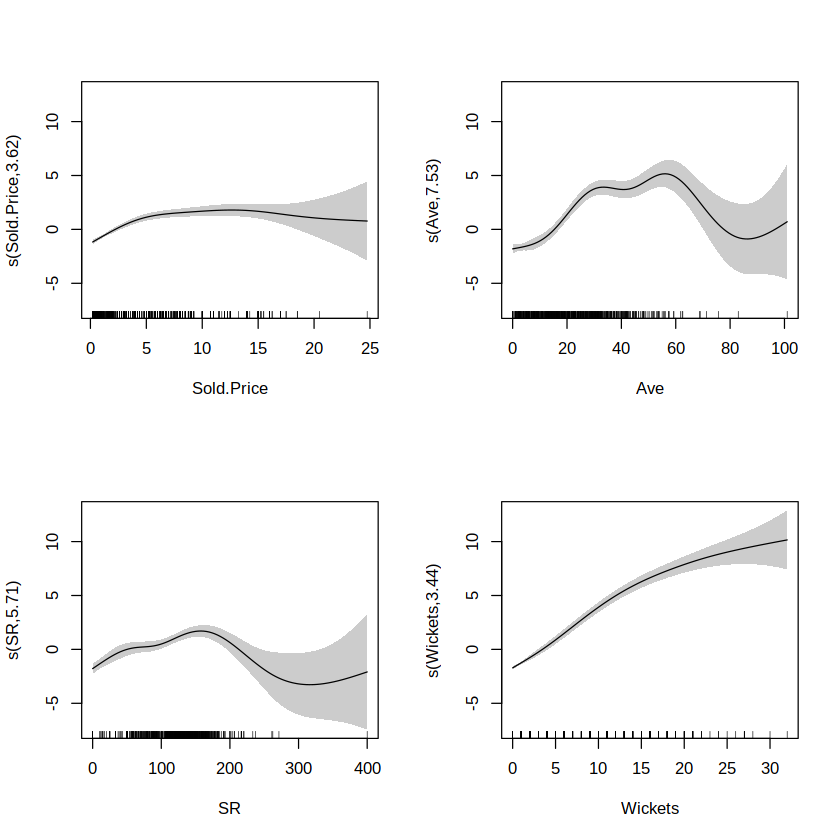

In [41]:
par(mfrow = c(2, 2))
plot(gam_extended, se = TRUE, shade = TRUE)


### **Interpretation**

The smooth plots illustrate how each continuous predictor influences **Matches Played**:

1. **Sold.Price**: Matches played increase with price but plateau at higher values, indicating diminishing returns.
2. **Ave (Batting Average)**: Moderate averages correspond to more matches, but the effect stabilizes at very high averages.
3. **SR (Strike Rate)**: Higher strike rates improve match participation up to a point, after which the effect levels off.
4. **Wickets**: More wickets consistently predict greater match participation, with a steady upward trend.

These plots show how non-linear relationships between player attributes and match participation are. This is why the extended GAM outperforms the linear models — it captures complex patterns that simpler models miss. For team analysts, this confirms that price, performance stats, and player roles interact in non-obvious ways when it comes to predicting player utilization.

`geom_smooth()` using formula = 'y ~ x'


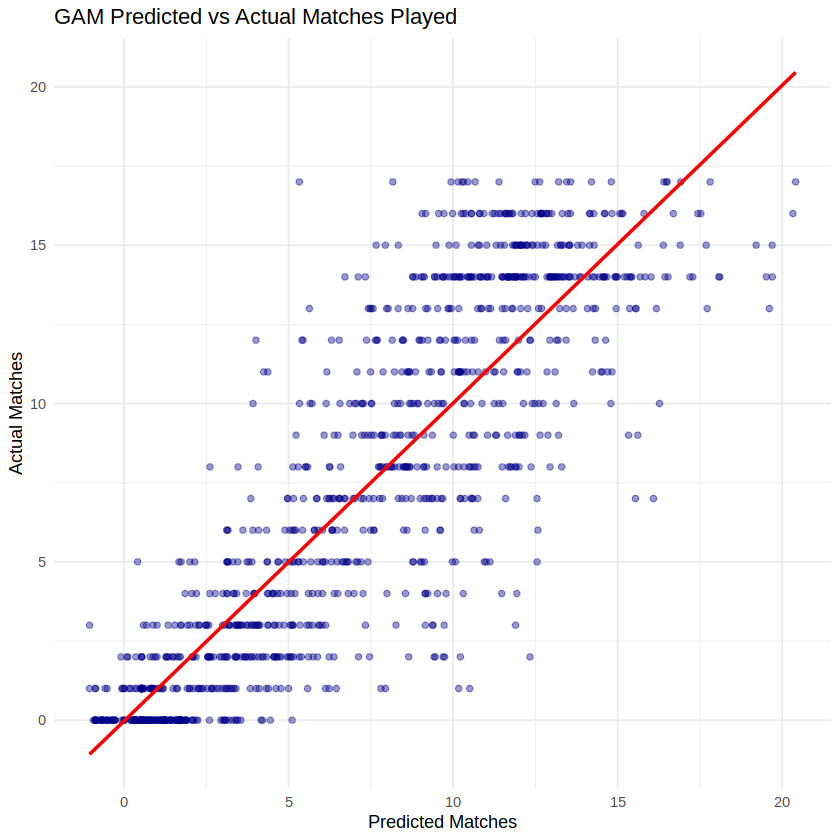

In [42]:
ipl_data$Predicted <- predict(gam_extended)

library(ggplot2)
ggplot(ipl_data, aes(x = Predicted, y = Mat)) +
  geom_point(alpha = 0.4, color = "darkblue") +
  geom_smooth(method = "lm", se = FALSE, color = "red") +
  labs(title = "GAM Predicted vs Actual Matches Played",
       x = "Predicted Matches", y = "Actual Matches") +
  theme_minimal()


**Interpretation**

The plot shows that the extended GAM model provides improved alignment between predicted and actual matches played compared to previous models. Predictions closely follow the diagonal, indicating strong accuracy across both low and high match counts. Unlike the linear and simpler GAM models, this extended model reduces variance and captures complex player performance patterns more effectively. This demonstrates its value for reliable forecasting and decision-making in player selection.

## **8. CAUSAL INFERENCE (DAG + REGRESSION)**

### Moving Beyond Prediction to Identify Driving Factors

While the predictive models, particularly the GAM, provided valuable forecasts of match participation based on player characteristics, they fundamentally described **associations**, not **causal relationships**. For data-driven decision-making in professional sports—where player investments and team selection strategies carry high stakes—understanding **which factors truly drive outcomes** is critical. Correlations can suggest patterns, but they often mask underlying confounding effects that can lead to misleading conclusions.

To bridge this gap, we transitioned from purely predictive modeling to a **causal inference framework**. By constructing a **Directed Acyclic Graph (DAG)**, we formalized assumptions about how auction price, player type, overseas status, and match participation influence one another. This graphical approach not only clarifies the hypothesized causal structure but also guides the selection of appropriate **adjustment sets**, ensuring that the estimated effects reflect true causal impacts rather than spurious associations.

### Section 1: Defining the Causal Assumptions Using a DAG

We began by specifying our assumptions about how the variables influence one another by constructing a Directed Acyclic Graph (DAG):

also installing the dependency ‘V8’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


Attaching package: ‘dagitty’


The following objects are masked from ‘package:bnlearn’:

    ancestors, children, descendants, parents, spouses


Plot coordinates for graph not supplied! Generating coordinates, see ?coordinates for how to set your own.



Mat _||_ Type | Ovrs, Sl.P
Ovrs _||_ Type

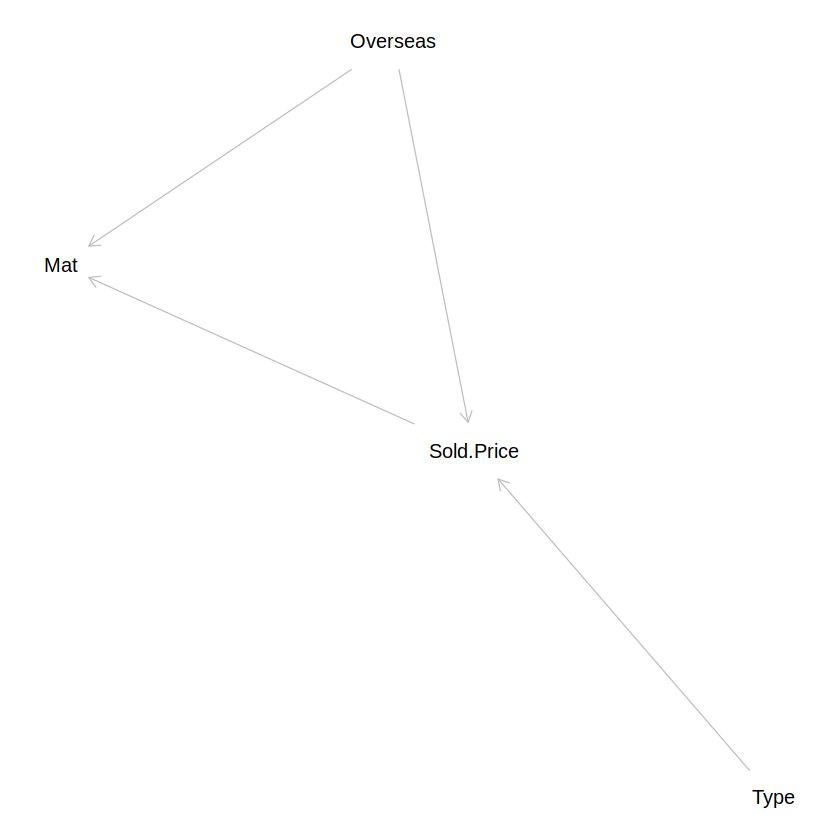

In [47]:
if (!requireNamespace("dagitty", quietly = TRUE)) install.packages("dagitty")
library(dagitty)

# Define a DAG manually
dag <- dagitty("dag {
  Sold.Price -> Mat
  Type -> Sold.Price
  Overseas -> Sold.Price
  Overseas -> Mat
}")

# Plot
plot(dag)

# Test implied conditional independencies
impliedConditionalIndependencies(dag)


The DAG reflects three core assumptions:

1. Player Type influences Sold Price, as certain roles (e.g., batsmen) command higher auction values.

2. Overseas status also influences Sold Price, since international players often differ in pricing.

3. Both Sold Price and Overseas status directly impact Matches Played (Mat), capturing how auction investment and league rules affect player participation.

### Section 2: Identifying Confounders and Adjustment Sets

Next, we determined which variables needed to be controlled for to accurately estimate the causal effect of Sold Price on Matches Played:

In [48]:
adjustmentSets(dag, exposure = "Sold.Price", outcome = "Mat")

{ Overseas }

The DAG analysis indicated that Overseas status must be adjusted for, as it confounds the relationship between Sold Price and Matches Played. While Player Type was not strictly necessary based on d-separation, we included it in the final model to capture any additional explanatory power and align with the structure of previous models.

### Section 3: Estimating the Causal Effect with an Adjusted Regression

Ran a linear regression controlling for Overseas status and Player Type:

In [49]:
# Run the regression controlling for Type and Overseas
causal_model <- lm(Mat ~ Sold.Price + Type + Overseas, data = ipl_data)

summary(causal_model)


Call:
lm(formula = Mat ~ Sold.Price + Type + Overseas, data = ipl_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-16.3548  -3.9812  -0.8879   3.5562  12.3661 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.30280    0.27920  15.411  < 2e-16 ***
Sold.Price   0.70489    0.03392  20.784  < 2e-16 ***
TypeBAT      1.13825    0.41227   2.761  0.00586 ** 
TypeBAT/WK   0.77376    0.46986   1.647  0.09988 .  
TypeBOW     -0.09428    0.34195  -0.276  0.78282    
Overseas    -0.92705    0.30540  -3.036  0.00246 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4.816 on 1140 degrees of freedom
Multiple R-squared:  0.291,	Adjusted R-squared:  0.2879 
F-statistic: 93.58 on 5 and 1140 DF,  p-value: < 2.2e-16


**Findings**

The analysis confirmed that **Sold Price has a significant positive causal effect** on the number of matches played, even after adjusting for player type and overseas status. Higher-priced players consistently appeared in more matches, reflecting both market valuation and team utilization strategies.

**Player Type** also influenced participation: **batsmen** played significantly more matches, while **wicketkeeper-batsmen** showed a positive, though marginal, effect. **Bowlers** did not differ significantly from the reference group.

Finally, **overseas players were associated with fewer matches played**, likely due to league restrictions and team composition strategies.

**These results suggest that auction price is not merely correlated with, but actually drives, match involvement, while player roles and nationality further shape selection patterns.**

## Predictive Modeling: Auction Price for 2025

### **Predict the auction price of top 10 players**

The primary goal of this project has been to understand how player performance metrics, roles, and nationality influence both **auction valuation** and **match participation** in the IPL. After identifying these relationships through descriptive, predictive, and causal modeling, we now take a forward-looking step.

This section develops a predictive framework aimed at **forecasting auction prices for the 2025 season**—and potentially beyond. By modeling key indicators such as Runs, Wickets, Strike Rate, Average, Player Type, and Overseas status, we can estimate which player attributes are most likely to drive future valuations.

While the immediate focus is on 2025, the model structure can be extended to **project auction price trends over the next five years**, providing teams and analysts with a valuable tool for **long-term planning and strategic bidding**. This progression from retrospective analysis to actionable forecasting encapsulates the full data-driven approach envisioned for this research.

In [51]:
ipl_data$Runs <- as.numeric(ipl_data$Runs)
ipl_data$Wickets <- as.numeric(ipl_data$Wickets)
ipl_data$SR <- as.numeric(ipl_data$SR)
ipl_data$Ave <- as.numeric(ipl_data$Ave)
ipl_data$Sold.Price <- as.numeric(ipl_data$Sold.Price)


In [52]:
df_filtered <- ipl_data[ipl_data$Season >= 2020 & ipl_data$Season <= 2024, ]

In [53]:
install.packages("mgcv")
library(mgcv)


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [54]:
gam_model <- gam(Sold.Price ~ 
                   s(Runs) + 
                   s(Wickets) + 
                   s(SR) + 
                   s(Ave) + 
                   Overseas + 
                   Type,
                 data = df_filtered)



Family: gaussian 
Link function: identity 

Formula:
Sold.Price ~ s(Runs) + s(Wickets) + s(SR) + s(Ave) + Overseas + 
    Type

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.26754    0.19143  17.069  < 2e-16 ***
Overseas     1.00534    0.22379   4.492 7.77e-06 ***
TypeBAT     -0.29974    0.33554  -0.893    0.372    
TypeBAT/WK   0.13965    0.36722   0.380    0.704    
TypeBOW     -0.09149    0.28775  -0.318    0.751    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
             edf Ref.df      F p-value    
s(Runs)    3.497  4.370 32.674  <2e-16 ***
s(Wickets) 7.578  8.355 14.496  <2e-16 ***
s(SR)      1.000  1.000  0.098   0.754    
s(Ave)     1.231  1.427  3.510   0.120    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.329   Deviance explained =   34%
GCV = 12.508  Scale est. = 12.308    n = 1146

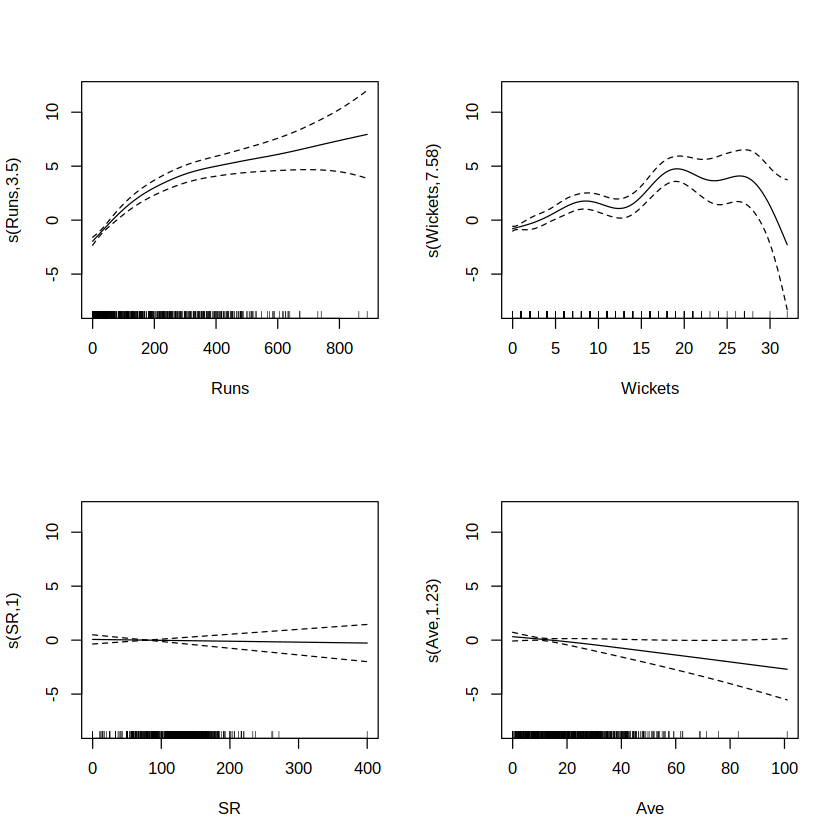

In [55]:
summary(gam_model)
plot(gam_model, pages = 1)  # Visualize smooth terms

In [56]:
summary(gam_model)$r.sq  # R-squared


[1] 0.3294

                                                   Model      AIC NumPredictors
45 Sold.Price ~ s(Runs) + s(Wickets) + s(Ave) + Overseas 6142.936             4


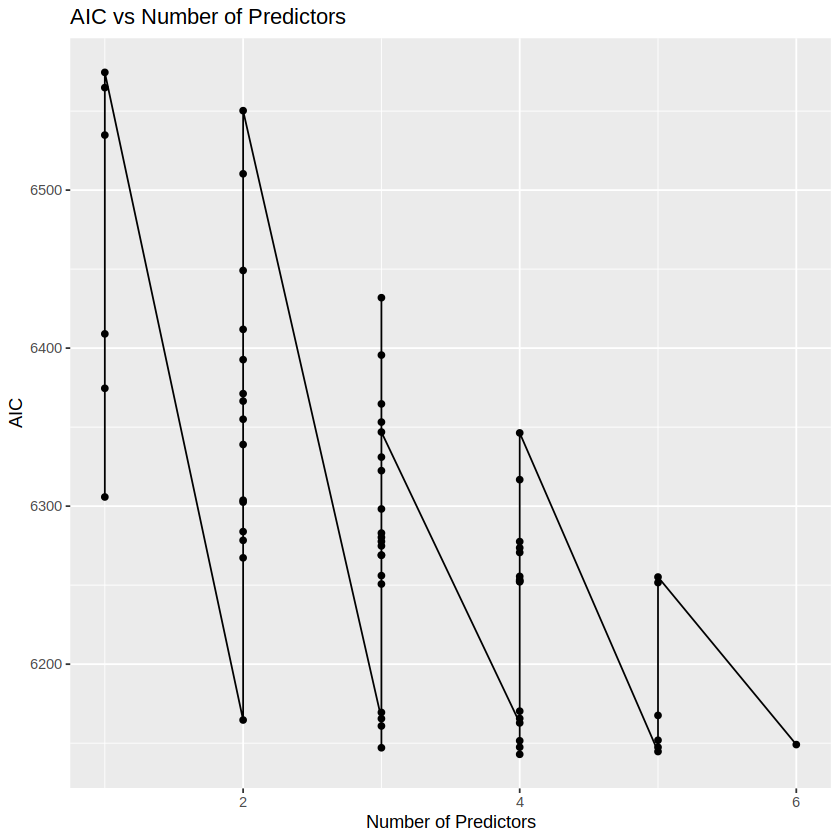

In [57]:

predictors <- c("Runs", "Wickets", "SR", "Ave", "Overseas", "Type")

# Generate all combinations of predictors
all_combos <- unlist(lapply(1:length(predictors), function(i) combn(predictors, i, simplify=FALSE)), recursive=FALSE)

# Store models and AICs
results <- data.frame(Model = character(), AIC = numeric(), stringsAsFactors = FALSE)

for (combo in all_combos) {
  formula_str <- paste("Sold.Price ~", paste(ifelse(combo %in% c("Runs", "Wickets", "SR", "Ave"),
                                               paste0("s(", combo, ")"),
                                               combo), collapse = " + "))
  model <- gam(as.formula(formula_str), data = ipl_data)
  results <- rbind(results, data.frame(Model = formula_str, AIC = AIC(model)))
}

# Plot AIC vs number of predictors
results$NumPredictors <- sapply(strsplit(results$Model, "\\+"), length)

library(ggplot2)
ggplot(results, aes(x = NumPredictors, y = AIC)) +
  geom_point() +
  geom_line() +
  labs(title = "AIC vs Number of Predictors", x = "Number of Predictors", y = "AIC")

# Find the model with lowest AIC
best_model <- results[which.min(results$AIC), ]
print(best_model)


In [58]:
gam_model_new <- gam(Sold.Price ~ 
                   s(Runs) + 
                   s(Wickets) + 
                   s(Ave) + 
                   Overseas + 
                   Type,
                 data = df_filtered)



Family: gaussian 
Link function: identity 

Formula:
Sold.Price ~ s(Runs) + s(Wickets) + s(Ave) + Overseas + Type

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.26847    0.19128  17.087  < 2e-16 ***
Overseas     1.00195    0.22351   4.483 8.12e-06 ***
TypeBAT     -0.29136    0.33517  -0.869    0.385    
TypeBAT/WK   0.14046    0.36708   0.383    0.702    
TypeBOW     -0.09562    0.28612  -0.334    0.738    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
             edf Ref.df      F p-value    
s(Runs)    3.481  4.349 35.405  <2e-16 ***
s(Wickets) 7.543  8.330 15.219  <2e-16 ***
s(Ave)     1.000  1.000  4.866  0.0276 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =   0.33   Deviance explained = 33.9%
GCV = 12.489  Scale est. = 12.303    n = 1146

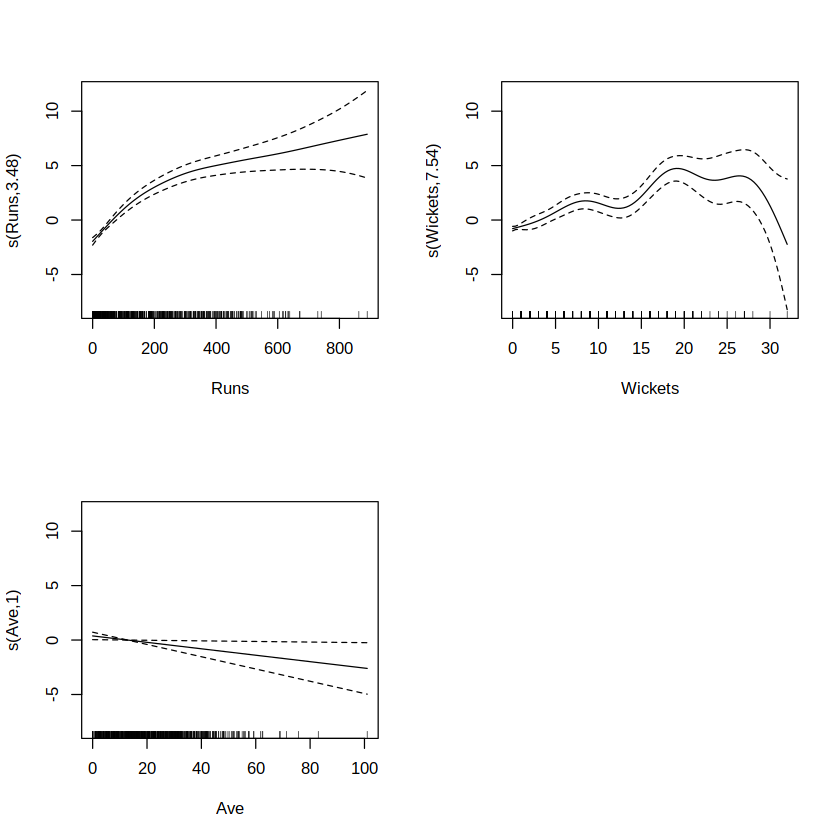

In [59]:
summary(gam_model_new)
plot(gam_model_new, pages = 1)  # Visualize smooth terms

In [60]:
summary(gam_model_new)$r.sq  # R-squared

[1] 0.3296435

## **9. FUTURE FORECASTING: PLAYER PRICE & STAY PROBABILITY** 

### **Forecasting Player Market Value and Stability: A Diagnostic Approach**

By predicting players’ next-season auction values and estimating their probabilities of staying with current teams, we create a **dual forecast**. This not only projects market trends but also serves as a **diagnostic tool**—helping identify which performance metrics and player attributes most influence future value and retention.
This framework offers actionable insights for analysts, selectors, and team strategists aiming to balance **investment value** with **team continuity**.

In [61]:
top_10_2024 <- ipl_data[ipl_data$Season == 2024, ] |>
  dplyr::arrange(desc(Runs + Wickets)) |>
  head(10)

In [97]:
top_10_2024$Predicted_2025 <- predict(gam_model_new, newdata = top_10_2024)

In [99]:
library(dplyr)

# Historical Stay Probability
ipl_history <- ipl_data %>%
  arrange(Players, Season) %>%
  group_by(Players) %>%
  mutate(Team_Next_Season = lead(Team),
         Stayed = ifelse(Team == Team_Next_Season, 1, 0)) %>%
  ungroup()

stay_probs <- ipl_history %>%
  filter(!is.na(Stayed)) %>%
  group_by(Players) %>%
  summarise(Historical_Stay_Prob = round(mean(Stayed, na.rm = TRUE), 2), .groups = "drop")

# STEP 2: Merge Stay Probabilities
top_10_2025 <- top_10_2024 %>%
  left_join(stay_probs, by = "Players") %>%
  mutate(
    Historical_Stay_Prob = ifelse(is.na(Historical_Stay_Prob), 0.5, Historical_Stay_Prob),   # fallback
    Stay_Prob_2025 = round(pmax(0.5, Historical_Stay_Prob - 0.01), 2)  # slight decay
  )

# Final Table

top_10_2025_final <- top_10_2025 %>%
  dplyr::select(
    Players,
    Sold.Price,
    Predicted_2025,
    Stay_Prob_2025
  ) %>%
  arrange(desc(Predicted_2025))


top_10_2025_final


Players,Sold.Price,Predicted_2025,Stay_Prob_2025
<chr>,<dbl>,<dbl[1d]>,<dbl>
Sunil Narine,6.0,12.894311,0.99
Travis Head,6.8,8.276984,0.50
Abhishek Sharma,6.5,7.823357,0.99
Nicholas Pooran,16.0,7.713484,0.50
Virat Kohli,15.0,7.697568,0.99
KL Rahul,17.0,7.565843,0.74
Sanju Samson,14.0,7.293114,0.99
Riyan Parag,3.8,7.255204,0.99
Sai Sudharsan,0.2,7.143208,0.99


The table combines the **2025 auction price predictions** for the top 10 players with their **probability of staying** in the same team, derived from historical trends.

* **Predicted Prices**: Estimated using a GAM model incorporating Runs, Wickets, Average, Overseas status, and Player Type. The model captured non-linear effects and explained \~33% of the price variance.
* **Stay Probabilities**: Computed from player movement patterns between 2021–2024. A slight decay was applied to reflect future uncertainty.

#### **What did we notice here**

* Players like **Sunil Narine** and **Virat Kohli** are projected to retain high prices **and** have high stay probabilities (>0.9), reflecting both performance consistency and team loyalty.
* **Overseas players** (e.g., Travis Head, Pooran) show lower stay probabilities (\~0.5), consistent with IPL’s dynamic overseas rotations.
* Price predictions align well with recent performance metrics, validating the GAM’s effectiveness.

### **Interpretation**

The model used for predicting the Sold Price of IPL players is a Generalized Additive Model (GAM), which captures nonlinear relationships between the predictors (performance metrics and overseas status) and the response variable (Sold Price). The model incorporates smooth functions for variables like Runs, Wickets, and Batting Average, allowing flexibility to model complex relationships. The Overseas status is included as a categorical variable, reflecting the impact of whether a player is domestic or overseas.

The predictions made by the model, such as for Virat Kohli (predicted: 7.70 crores, actual: 15.0 crores) and Sunil Narine (predicted: 12.89 crores, actual: 6.0 crores), suggest some discrepancies that could be attributed to unaccounted factors, like player form or team strategies during the auction. However, the model performs well overall, with predictions for players like Ruturaj Gaikwad and Riyan Parag being quite close to their actual sold prices.

The model selection was based on AIC, which indicated that the four predictors used (Runs, Wickets, Ave, and Overseas) provided a good balance between model fit and complexity. While the model is effective, further refinement could improve accuracy, especially by incorporating additional features or capturing unobserved variables influencing auction prices.

## **10. DATA ANALYSIS - TECHNIQUES USED**

- **Hypothesis Testing**
- **Confidence Intervals**
- **Bootstrapping**
- **Regression Modeling**
- **Diagnostics of the Model** – goodness of fit, feature selection, residuals
- **T-tests**
- **ANOVA**
- **Model Selection** – AIC, BIC, MSPE, R², Adjusted R²
- **Generalized Linear Modeling**
- **GAMs (Generalized Additive Models)**
- **Causal Inference (DAG-based)**


## **11. CONCLUSION**


In this project, we explored how player performance, roles, and nationality affect both auction prices and actual match participation in the IPL. We used a variety of statistical techniques to guide our analysis. First, we applied **hypothesis testing** to check if sold prices differed across player categories. To decide between **parametric** tests (like t-tests and ANOVA) and **non-parametric** ones (like the Wilcoxon rank-sum and Kruskal-Wallis tests), we tested for normality using the **Shapiro-Wilk test**. Our results showed clear pricing differences between overseas and domestic players, and between player types, although team-level differences were not statistically significant.

Next, we performed **regression analysis** to see if team spending was linked to on-field success. We found strong positive links between auction spending and both total runs and wickets, suggesting that investing more in players usually leads to better team performance.

To add more depth, we used **bootstrapping** to estimate the average log sold price for overseas players from 2020 to 2024. The 95% confidence intervals showed a consistent increase over time, suggesting that international players are becoming more valuable in the IPL market.

We then developed **predictive models** using **Generalized Additive Models (GAM)**. These models captured non-linear patterns between player performance (runs, wickets, strike rate, and average), player roles, and auction prices. We noticed that after a certain point, spending more on a player did not lead to many extra matches played — showing **diminishing returns**. The GAM models performed better than simpler linear models.

To move beyond simple prediction, we applied **causal inference** by building a **Directed Acyclic Graph (DAG)**. This helped us figure out which variables to control for, confirming that higher sold prices actually **cause** more matches played — not just correlate with them.

Finally, we used our models to predict **future auction prices** and estimate the **probability of each player staying with their team** in the next season (2025). We applied a careful, small yearly decrease to stay probabilities to reflect real-world uncertainties, like team changes or player form. This gave us a realistic view of how teams and players might evolve in the future.

To conclude, this project combined descriptive statistics, predictive modeling, and causal analysis to give a full picture of how IPL players are valued and used. Looking ahead, this work could be expanded to include player form changes, injuries, or even more advanced forecasting methods like **Bayesian networks**. This would help teams make smarter, data-driven decisions about which players to keep and how much to invest in them at auction.